# **IMPORT LIBRARY**

In [ ]:
import os
import sys
import time
import math
import glob
import sklearn
import matplotlib
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.metrics import MeanAbsoluteError, MeanSquaredError, RootMeanSquaredError
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [ ]:
print(sys.version)
print(pd.__version__)
print(np.__version__)
print(matplotlib.__version__)
print(sklearn.__version__)
print(tf.__version__)
print(sns.__version__)

3.10.12 (main, Sep 11 2024, 15:47:36) [GCC 11.4.0]
2.2.2
1.26.4
3.8.0
1.5.2
2.17.1
0.13.2


# IMPORT DATAFRAME

In [ ]:
df1 = pd.read_csv("/content/df_DKI1 Bunderan HI.csv")
df1['tanggal']= pd.to_datetime(df1['tanggal'])
df1.set_index(['tanggal'], inplace=True)
df1.head()

,stasiun,pm10,pm25,so2,co,o3,no2
tanggal,,,,,,,
2021-02-01,DKI1 Bunderan HI,59.0,79.0,21.0,26.0,15.0,31.0
2021-02-02,DKI1 Bunderan HI,30.0,46.0,21.0,14.0,16.0,24.0
2021-02-03,DKI1 Bunderan HI,23.0,33.0,19.0,11.0,14.0,19.0
2021-02-04,DKI1 Bunderan HI,36.0,53.0,23.0,14.0,12.0,24.0
2021-02-05,DKI1 Bunderan HI,29.0,36.0,20.0,14.0,12.0,21.0


In [ ]:
df2 = pd.read_csv("/content/df_DKI2 Kelapa Gading.csv")
df2['tanggal']= pd.to_datetime(df2['tanggal'])
df2.set_index(['tanggal'], inplace=True)
df2.head()

,stasiun,pm10,pm25,so2,co,o3,no2
tanggal,,,,,,,
2021-02-01,DKI2 Kelapa Gading,64.0,87.0,38.0,16.0,46.0,25.0
2021-02-02,DKI2 Kelapa Gading,30.0,42.0,38.0,4.0,55.0,15.0
2021-02-03,DKI2 Kelapa Gading,24.0,35.0,38.0,4.0,42.0,15.0
2021-02-04,DKI2 Kelapa Gading,33.0,50.0,39.0,7.0,47.0,15.0
2021-02-05,DKI2 Kelapa Gading,25.0,35.0,39.0,5.0,45.0,13.0


In [ ]:
df3 = pd.read_csv("/content/df_DKI3 Jagakarsa.csv")
df3['tanggal']= pd.to_datetime(df3['tanggal'])
df3.set_index(['tanggal'], inplace=True)
df3.head()

,stasiun,pm10,pm25,so2,co,o3,no2
tanggal,,,,,,,
2021-02-01,DKI3 Jagakarsa,73.0,110.0,28.0,18.0,26.0,18.0
2021-02-02,DKI3 Jagakarsa,53.0,70.0,25.0,10.0,27.0,14.0
2021-02-03,DKI3 Jagakarsa,32.0,53.0,27.0,6.0,24.0,9.0
2021-02-04,DKI3 Jagakarsa,29.0,54.0,26.0,11.0,24.0,13.0
2021-02-05,DKI3 Jagakarsa,27.0,51.0,24.0,10.0,24.0,12.0


In [ ]:
df4 = pd.read_csv("/content/df_DKI4 Lubang Buaya.csv")
df4['tanggal']= pd.to_datetime(df4['tanggal'])
df4.set_index(['tanggal'], inplace=True)
df4.head()

,stasiun,pm10,pm25,so2,co,o3,no2
tanggal,,,,,,,
2021-02-01,DKI4 Lubang Buaya,50.5,76.500000,32.5,13.5,24.5,13.5
2021-02-02,DKI4 Lubang Buaya,37.0,59.000000,40.0,14.0,22.0,12.0
2021-01-01,DKI4 Lubang Buaya,41.0,14.698113,37.0,14.0,35.0,4.0
2021-01-02,DKI4 Lubang Buaya,44.0,16.396226,38.0,38.0,59.0,3.0
2021-01-03,DKI4 Lubang Buaya,50.0,18.094340,37.0,16.0,52.0,5.0


In [ ]:
df5 = pd.read_csv("/content/df_DKI5 Kebon Jeruk.csv")
df5['tanggal']= pd.to_datetime(df5['tanggal'])
df5.set_index(['tanggal'], inplace=True)
df5.head()

,stasiun,pm10,pm25,so2,co,o3,no2
tanggal,,,,,,,
2021-01-22,DKI5 Kebon Jeruk,45.0,79.0,21.0,13.0,40.0,15.0
2021-01-23,DKI5 Kebon Jeruk,80.0,79.0,22.0,44.0,44.0,22.0
2021-01-24,DKI5 Kebon Jeruk,27.0,79.0,14.0,9.0,29.0,17.5
2021-01-25,DKI5 Kebon Jeruk,55.0,79.0,19.0,29.0,67.0,13.0
2021-01-26,DKI5 Kebon Jeruk,57.0,79.0,21.0,23.0,36.0,16.0


# NORMALISASI

In [ ]:
polutan_column = ['pm10', 'pm25', 'so2', 'co', 'o3', 'no2']
#Normalisasi
scaler= MinMaxScaler(feature_range=(0, 1))

In [ ]:
df1[polutan_column] = scaler.fit_transform(df1[polutan_column])
df1 = df1[polutan_column]
df1

,pm10,pm25,so2,co,o3,no2
tanggal,,,,,,
2021-02-01,0.666667,0.594340,0.116505,0.575,0.189655,0.369863
2021-02-02,0.183333,0.283019,0.116505,0.275,0.206897,0.273973
2021-02-03,0.066667,0.160377,0.097087,0.200,0.172414,0.205479
2021-02-04,0.283333,0.349057,0.135922,0.275,0.137931,0.273973
2021-02-05,0.166667,0.188679,0.106796,0.275,0.137931,0.232877
...,...,...,...,...,...,...
2023-11-30,0.316667,0.481132,0.330097,0.225,0.517241,0.410959
2022-09-13,0.666667,0.613208,0.417476,0.375,0.706897,0.383562
2022-10-18,0.666667,0.594340,0.398058,0.325,0.706897,0.424658


In [ ]:
df2[polutan_column] = scaler.fit_transform(df2[polutan_column])
df2 = df2[polutan_column]
df2

,pm10,pm25,so2,co,o3,no2
tanggal,,,,,,
2021-02-01,0.605263,0.607477,0.4500,0.250000,0.210526,0.2500
2021-02-02,0.157895,0.186916,0.4500,0.019231,0.263158,0.1250
2021-02-03,0.078947,0.121495,0.4500,0.019231,0.187135,0.1250
2021-02-04,0.197368,0.261682,0.4625,0.076923,0.216374,0.1250
2021-02-05,0.092105,0.121495,0.4625,0.038462,0.204678,0.1000
...,...,...,...,...,...,...
2022-07-25,0.500000,0.607477,0.5500,0.250000,0.473684,0.2375
2022-07-24,0.473684,0.560748,0.5625,0.211538,0.491228,0.2000
2022-07-21,0.750000,0.822430,0.6000,0.230769,0.608187,0.2875


In [ ]:
df3[polutan_column] = scaler.fit_transform(df3[polutan_column])
df3 = df3[polutan_column]
df3

,pm10,pm25,so2,co,o3,no2
tanggal,,,,,,
2021-02-01,0.769231,0.763359,0.256098,0.246377,0.155405,0.089109
2021-02-02,0.549451,0.458015,0.219512,0.130435,0.162162,0.069307
2021-02-03,0.318681,0.328244,0.243902,0.072464,0.141892,0.044554
2021-02-04,0.285714,0.335878,0.231707,0.144928,0.141892,0.064356
2021-02-05,0.263736,0.312977,0.207317,0.130435,0.141892,0.059406
...,...,...,...,...,...,...
2022-02-04,0.560440,0.473282,0.475610,0.159420,0.439189,0.133663
2022-03-22,0.516484,0.404580,0.378049,0.159420,0.216216,0.084158
2022-05-12,0.637363,0.572519,0.573171,0.173913,0.405405,0.123762


In [ ]:
df4[polutan_column] = scaler.fit_transform(df4[polutan_column])
df4 = df4[polutan_column]
df4

,pm10,pm25,so2,co,o3,no2
tanggal,,,,,,
2021-02-01,0.221212,0.226961,0.459184,0.260417,0.160448,0.23
2021-02-02,0.139394,0.162694,0.612245,0.270833,0.141791,0.20
2021-01-01,0.163636,0.000000,0.551020,0.270833,0.238806,0.04
2021-01-02,0.181818,0.006236,0.571429,0.770833,0.417910,0.02
2021-01-03,0.218182,0.012472,0.551020,0.312500,0.365672,0.06
...,...,...,...,...,...,...
2022-07-14,0.430303,0.405072,0.755102,0.500000,0.402985,0.62
2022-07-13,0.333333,0.364676,0.775510,0.312500,0.462687,0.54
2022-07-12,0.381818,0.397727,0.795918,0.333333,0.604478,0.52


In [ ]:
df5[polutan_column] = scaler.fit_transform(df5[polutan_column])
df5 = df5[polutan_column]
df5

,pm10,pm25,so2,co,o3,no2
tanggal,,,,,,
2021-01-22,0.430380,0.491667,0.316947,0.200000,0.292453,0.218750
2021-01-23,0.873418,0.491667,0.338292,0.763636,0.330189,0.328125
2021-01-24,0.202532,0.491667,0.167529,0.127273,0.188679,0.257812
2021-01-25,0.556962,0.491667,0.274256,0.490909,0.547170,0.187500
2021-01-26,0.582278,0.491667,0.316947,0.381818,0.254717,0.234375
...,...,...,...,...,...,...
2022-03-27,0.924051,0.883333,0.850582,0.854545,0.311321,0.781250
2022-03-25,1.000000,0.850000,0.957309,0.309091,0.575472,0.437500
2022-03-23,0.443038,0.341667,0.743855,0.254545,0.235849,0.281250


# PEMBAGIAN DATA LATIH, VALIDASI DAN UJI

In [ ]:
# Data split
#Tanggal pembagian data
split_date_train_test='2024-01-01'
split_date_val_test = '2024-04-01'

In [ ]:
train_dki1 = df1.loc[df1.index < split_date_train_test]
val_dki1 = df1.loc[(df1.index >= split_date_train_test) & (df1.index < split_date_val_test)]
test_dki1 = df1.loc[df1.index >= split_date_val_test]

# shape pembagian data
print (f"Data Train Shape:", train_dki1.shape)
print (f"Data Validasi Shape:", val_dki1.shape)
print (f"Data Test Shape:", test_dki1.shape)

Data Train Shape: (734, 6)
Data Validasi Shape: (91, 6)
Data Test Shape: (91, 6)


In [ ]:
train_dki2 = df2.loc[df2.index < split_date_train_test]
val_dki2 = df2.loc[(df2.index >= split_date_train_test) & (df2.index < split_date_val_test)]
test_dki2 = df2.loc[df2.index >= split_date_val_test]

# shape pembagian data
print (f"Data Train Shape:", train_dki2.shape)
print (f"Data Validasi Shape:", val_dki2.shape)
print (f"Data Test Shape:", test_dki2.shape)

Data Train Shape: (769, 6)
Data Validasi Shape: (91, 6)
Data Test Shape: (91, 6)


In [ ]:
train_dki3 = df3.loc[df3.index < split_date_train_test]
val_dki3 = df3.loc[(df3.index >= split_date_train_test) & (df3.index < split_date_val_test)]
test_dki3 = df3.loc[df3.index >= split_date_val_test]

# shape pembagian data
print (f"Data Train Shape:", train_dki3.shape)
print (f"Data Validasi Shape:", val_dki3.shape)
print (f"Data Test Shape:", test_dki3.shape)

Data Train Shape: (763, 6)
Data Validasi Shape: (91, 6)
Data Test Shape: (91, 6)


In [ ]:
train_dki4 = df4.loc[df4.index < split_date_train_test]
val_dki4 = df4.loc[(df4.index >= split_date_train_test) & (df4.index < split_date_val_test)]
test_dki4 = df4.loc[df4.index >= split_date_val_test]

# shape pembagian data
print (f"Data Train Shape:", train_dki4.shape)
print (f"Data Validasi Shape:", val_dki4.shape)
print (f"Data Test Shape:", test_dki4.shape)

Data Train Shape: (997, 6)
Data Validasi Shape: (91, 6)
Data Test Shape: (91, 6)


In [ ]:
train_dki5 = df5.loc[df5.index < split_date_train_test]
val_dki5 = df5.loc[(df5.index >= split_date_train_test) & (df5.index < split_date_val_test)]
test_dki5 = df5.loc[df5.index >= split_date_val_test]

# shape pembagian data
print (f"Data Train Shape:", train_dki5.shape)
print (f"Data Validasi Shape:", val_dki5.shape)
print (f"Data Test Shape:", test_dki5.shape)

Data Train Shape: (752, 6)
Data Validasi Shape: (91, 6)
Data Test Shape: (91, 6)


# VISUALISASI


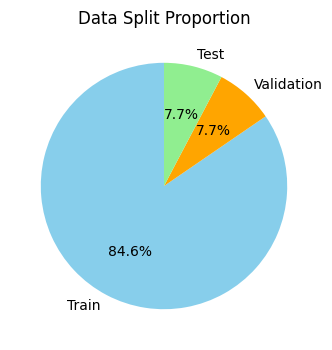

In [ ]:
import matplotlib.pyplot as plt

# Define the sizes based on the shapes of the datasets
train_size = 997
val_size = 91
test_size = 91
total_size = train_size + val_size + test_size

# Labels for each section
labels = ['Train', 'Validation', 'Test']

# Values for each section
sizes = [train_size, val_size, test_size]

# Colors for each section
colors = ['skyblue', 'orange', 'lightgreen']

# Create the pie chart
plt.figure(figsize=(6, 4))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=colors)
plt.title("Data Split Proportion")
plt.show()

In [ ]:
train_dfs = [train_dki1, train_dki2, train_dki3, train_dki4, train_dki5]
val_dfs = [val_dki1, val_dki2, val_dki3, val_dki4, val_dki5]
test_dfs = [test_dki1, test_dki2, test_dki3, test_dki4, test_dki5]

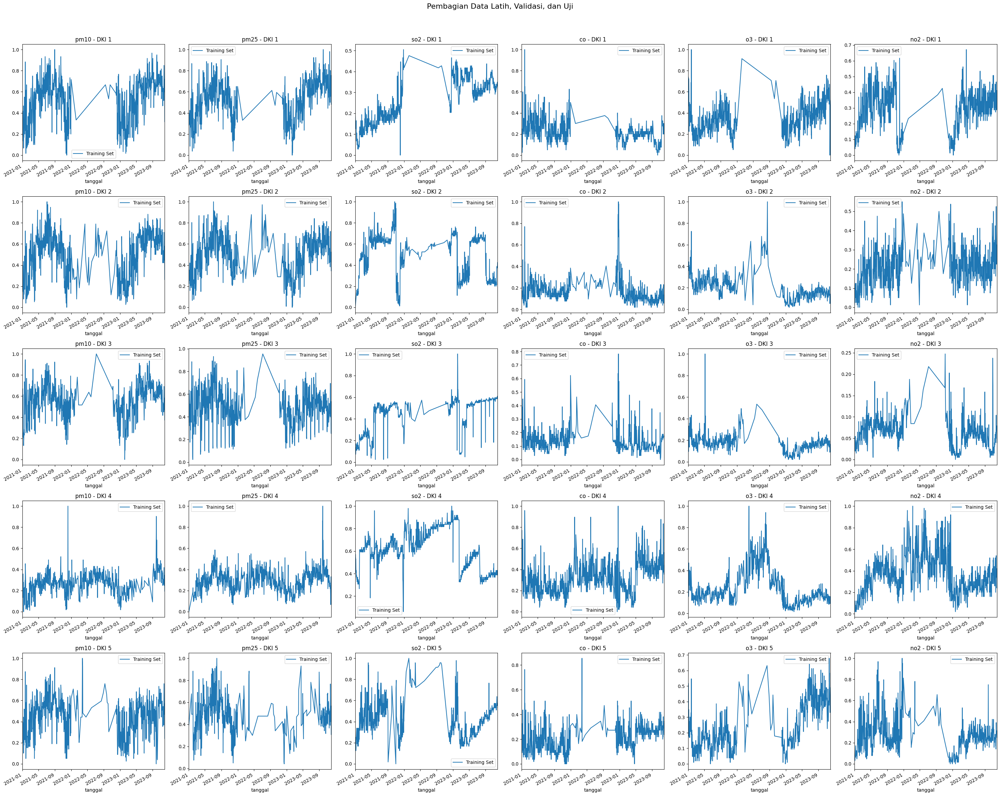

In [ ]:
# Plotting the data
fig, axes = plt.subplots(nrows=5, ncols=6, figsize=(30, 25))

for i in range(5):
    for j, var in enumerate(polutan_column):
        ax = axes[i, j]
        train_dfs[i] = train_dfs[i].sort_values('tanggal')
        train_dfs[i][var].plot(ax=ax, label='Training Set')
        train_start = train_dfs[i].index.min()
        train_end= train_dfs[i].index.max()

        # Menghitung rentang tengah berdasarkan data validasi
        ax.set_xlim(left=train_start, right=train_end)

        ax.set_title(f'{var} - DKI {i+1}')
        ax.legend(['Training Set'])

plt.suptitle('Pembagian Data Latih, Validasi, dan Uji', y=0.95, fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.93])
plt.show()

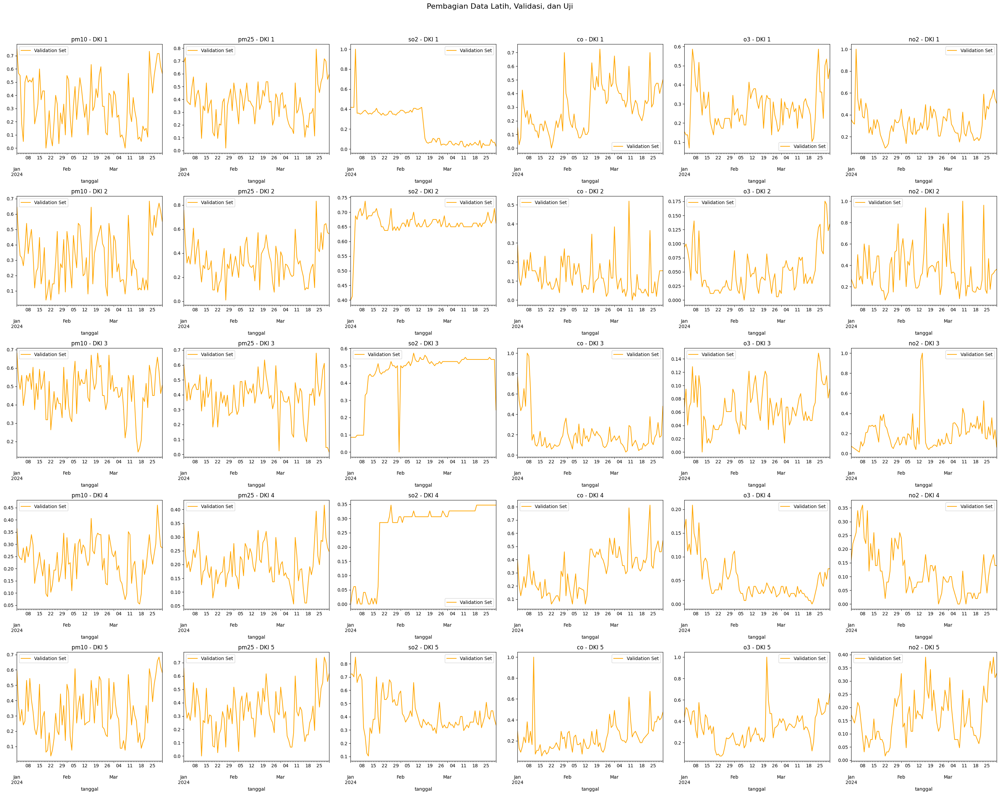

In [ ]:
# Plotting the data
fig, axes = plt.subplots(nrows=5, ncols=6, figsize=(30, 25))

for i in range(5):
    for j, var in enumerate(polutan_column):
        ax = axes[i, j]
        val_dfs[i] = val_dfs[i].sort_values('tanggal')
        val_dfs[i][var].plot(ax=ax, label='Validation Set', color='orange')
        val_start = val_dfs[i].index.min()
        val_end= val_dfs[i].index.max()

        # Menghitung rentang tengah berdasarkan data validasi
        ax.set_xlim(left=val_start, right=val_end)

        ax.set_title(f'{var} - DKI {i+1}')
        ax.legend(['Validation Set'])

plt.suptitle('Pembagian Data Latih, Validasi, dan Uji', y=0.95, fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.93])
plt.show()

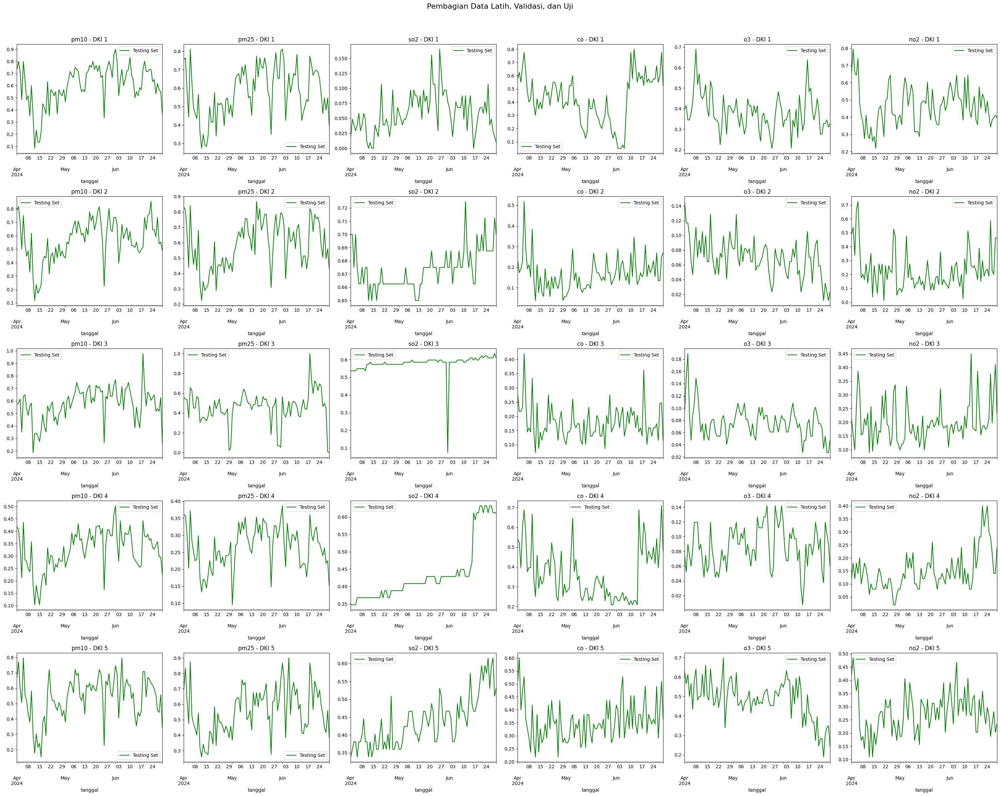

In [ ]:
# Plotting the data
fig, axes = plt.subplots(nrows=5, ncols=6, figsize=(30, 25))

for i in range(5):
    for j, var in enumerate(polutan_column):
        ax = axes[i, j]
        test_dfs[i] = test_dfs[i].sort_values('tanggal')
        test_dfs[i][var].plot(ax=ax, label='Testing Set', color='green')
        test_start = test_dfs[i].index.min()
        test_end= test_dfs[i].index.max()

        # Menghitung rentang tengah berdasarkan data validasi
        ax.set_xlim(left=test_start, right=test_end)

        ax.set_title(f'{var} - DKI {i+1}')
        ax.legend(['Testing Set'])

plt.suptitle('Pembagian Data Latih, Validasi, dan Uji', y=0.95, fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.93])
plt.show()

# **Penentuan Array dan Fitur Label**

In [ ]:
#Percobaan Window size = 1, 2, 7, 14, 30
def create_X_y(df, window_size):
  data = df.to_numpy ()
  X = []
  y = []
  for i in range(len(data)-window_size):
    row = [r for r in data[i:i+window_size]]
    X.append(row)
    label = data[i+window_size][0], data[i+window_size][1], data[i+window_size][2],data[i+window_size][3], data[i+window_size][4], data[i+window_size][5]
    y.append(label)
  return np.array (X), np.array (y)
WINDOW_SIZE = 14

In [ ]:
train_dfs = [train_dki1, train_dki2, train_dki3, train_dki4, train_dki5]
val_dfs = [val_dki1, val_dki2, val_dki3, val_dki4, val_dki5]
test_dfs = [test_dki1, test_dki2, test_dki3, test_dki4, test_dki5]

In [ ]:
# Splitting the training datasets
X_train1, y_train1 = create_X_y(train_dfs[0], WINDOW_SIZE)
X_train2, y_train2 = create_X_y(train_dfs[1], WINDOW_SIZE)
X_train3, y_train3 = create_X_y(train_dfs[2], WINDOW_SIZE)
X_train4, y_train4 = create_X_y(train_dfs[3], WINDOW_SIZE)
X_train5, y_train5 = create_X_y(train_dfs[4], WINDOW_SIZE)

# Splitting the validation datasets
X_val1, y_val1 = create_X_y(val_dfs[0], WINDOW_SIZE)
X_val2, y_val2 = create_X_y(val_dfs[1], WINDOW_SIZE)
X_val3, y_val3 = create_X_y(val_dfs[2], WINDOW_SIZE)
X_val4, y_val4 = create_X_y(val_dfs[3], WINDOW_SIZE)
X_val5, y_val5 = create_X_y(val_dfs[4], WINDOW_SIZE)

# Splitting the test datasets
X_test1, y_test1 = create_X_y(test_dfs[0], WINDOW_SIZE)
X_test2, y_test2 = create_X_y(test_dfs[1], WINDOW_SIZE)
X_test3, y_test3 = create_X_y(test_dfs[2], WINDOW_SIZE)
X_test4, y_test4 = create_X_y(test_dfs[3], WINDOW_SIZE)
X_test5, y_test5 = create_X_y(test_dfs[4], WINDOW_SIZE)


In [ ]:
print(X_train1.shape, y_train1.shape)
print(X_val1.shape, y_val1.shape)
print(X_test1.shape, y_test1.shape)

(720, 14, 6) (720, 6)
(77, 14, 6) (77, 6)
(77, 14, 6) (77, 6)


In [ ]:
print(X_train2.shape, y_train2.shape)
print(X_val2.shape, y_val2.shape)
print(X_test2.shape, y_test2.shape)

(755, 14, 6) (755, 6)
(77, 14, 6) (77, 6)
(77, 14, 6) (77, 6)


In [ ]:
print(X_train3.shape, y_train3.shape)
print(X_val3.shape, y_val3.shape)
print(X_test3.shape, y_test3.shape)

(749, 14, 6) (749, 6)
(77, 14, 6) (77, 6)
(77, 14, 6) (77, 6)


In [ ]:
print(X_train4.shape, y_train4.shape)
print(X_val4.shape, y_val4.shape)
print(X_test4.shape, y_test4.shape)

(983, 14, 6) (983, 6)
(77, 14, 6) (77, 6)
(77, 14, 6) (77, 6)


In [ ]:
print(X_train5.shape, y_train5.shape)
print(X_val5.shape, y_val5.shape)
print(X_test5.shape, y_test5.shape)

(738, 14, 6) (738, 6)
(77, 14, 6) (77, 6)
(77, 14, 6) (77, 6)


# **PEMBUATAN MODEL**

In [ ]:
# Model LSTM
model_CNNLSTM = tf.keras.Sequential([
    tf.keras.layers.InputLayer((WINDOW_SIZE, 6)),
    tf.keras.layers.Conv1D(filters=64, kernel_size=1, activation=tf.keras.layers.LeakyReLU(alpha=0.7)),
    tf.keras.layers.MaxPooling1D(pool_size=1),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.LSTM(64, return_sequences=True),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(6)
])
model_CNNLSTM.compile(optimizer=tf.keras.optimizers.Adam(),loss=tf.losses.MeanSquaredError(), metrics = [RootMeanSquaredError()])

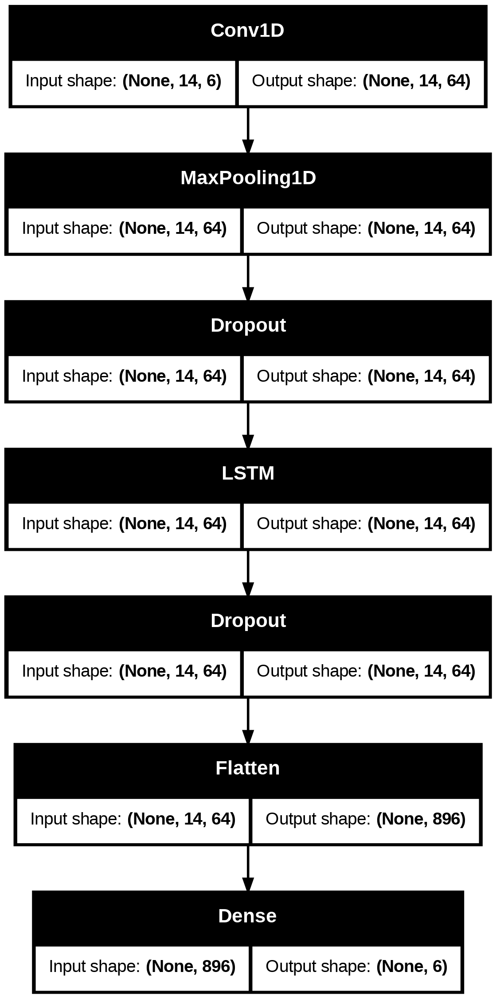

In [ ]:
#Arsitektur MODEL
tf.keras.utils.plot_model(model=model_CNNLSTM, show_shapes=True)

# **PELATIHAN MODEL**

In [ ]:
lr_schedule = tf.keras.callbacks.LearningRateScheduler(lambda epoch: 1e-4 * 10 ** (epoch / 20))
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=20, restore_best_weights=True)

batch_size = 16
epochs= 100

In [ ]:
import timeit

# Mencatat waktu mulai
start_time = timeit.default_timer()
history1 = model_CNNLSTM.fit(X_train1, y_train1,
            validation_data= (X_val1,
                              y_val1),
            epochs= epochs,
            batch_size = batch_size,
            callbacks = [lr_schedule, early_stopping])
# Mencatat waktu selesai
end_time = timeit.default_timer()

# Menghitung dan menampilkan waktu komputasi
elapsed_time = end_time - start_time
print(f"Waktu komputasi untuk training: {elapsed_time:.4f} detik")
final_learning_rate = model_CNNLSTM.optimizer.learning_rate.numpy()
print(f"Learning rate akhir setelah pelatihan: {final_learning_rate:.6f}")

Epoch 1/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step - loss: 0.1276 - root_mean_squared_error: 0.3549 - val_loss: 0.0334 - val_root_mean_squared_error: 0.1828 - learning_rate: 1.0000e-04
Epoch 2/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0261 - root_mean_squared_error: 0.1616 - val_loss: 0.0302 - val_root_mean_squared_error: 0.1738 - learning_rate: 1.1220e-04
Epoch 3/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0220 - root_mean_squared_error: 0.1485 - val_loss: 0.0287 - val_root_mean_squared_error: 0.1696 - learning_rate: 1.2589e-04
Epoch 4/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0223 - root_mean_squared_error: 0.1491 - val_loss: 0.0262 - val_root_mean_squared_error: 0.1618 - learning_rate: 1.4125e-04
Epoch 5/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0190 - root_mean_squared_error: 0.1380 - val_loss: 0.0253 - val_root_mean_squared_error: 0.1592 - learning_rate: 1.5849e-04
Epoch 6/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0185 - r

In [ ]:
import timeit

# Mencatat waktu mulai
start_time = timeit.default_timer()
history2 = model_CNNLSTM.fit(X_train2, y_train2,
            validation_data= (X_val2,
                              y_val2),
            epochs= epochs,
            batch_size = batch_size,
            callbacks = [lr_schedule, early_stopping])
# Mencatat waktu selesai
end_time = timeit.default_timer()

# Menghitung dan menampilkan waktu komputasi
elapsed_time = end_time - start_time
print(f"Waktu komputasi untuk training: {elapsed_time:.4f} detik")
final_learning_rate = model_CNNLSTM.optimizer.learning_rate.numpy()
print(f"Learning rate akhir setelah pelatihan: {final_learning_rate:.6f}")

Epoch 1/100
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0159 - root_mean_squared_error: 0.1262 - val_loss: 0.0217 - val_root_mean_squared_error: 0.1475 - learning_rate: 1.0000e-04
Epoch 2/100
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0151 - root_mean_squared_error: 0.1228 - val_loss: 0.0221 - val_root_mean_squared_error: 0.1485 - learning_rate: 1.1220e-04
Epoch 3/100
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0127 - root_mean_squared_error: 0.1126 - val_loss: 0.0217 - val_root_mean_squared_error: 0.1472 - learning_rate: 1.2589e-04
Epoch 4/100
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0136 - root_mean_squared_error: 0.1168 - val_loss: 0.0220 - val_root_mean_squared_error: 0.1485 - learning_rate: 1.4125e-04
Epoch 5/100
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0124 - root_mean_squared_error: 0.1110 - val_loss: 0.0213 - val_root_mean_squared_error: 0.1460 - learning_rate: 1.5849e-04
Epoch 6/100
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0122 - root_m

In [ ]:
import timeit

# Mencatat waktu mulai
start_time = timeit.default_timer()
history3 = model_CNNLSTM.fit(X_train3, y_train3,
            validation_data = (X_val3, y_val3),
            epochs = epochs,
            batch_size = batch_size,
            callbacks = [lr_schedule, early_stopping])
# Mencatat waktu selesai
end_time = timeit.default_timer()

# Menghitung dan menampilkan waktu komputasi
elapsed_time = end_time - start_time
print(f"Waktu komputasi untuk training: {elapsed_time:.4f} detik")
final_learning_rate = model_CNNLSTM.optimizer.learning_rate.numpy()
print(f"Learning rate akhir setelah pelatihan: {final_learning_rate:.6f}")

Epoch 1/100
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0120 - root_mean_squared_error: 0.1096 - val_loss: 0.0166 - val_root_mean_squared_error: 0.1289 - learning_rate: 1.0000e-04
Epoch 2/100
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0111 - root_mean_squared_error: 0.1056 - val_loss: 0.0168 - val_root_mean_squared_error: 0.1297 - learning_rate: 1.1220e-04
Epoch 3/100
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0104 - root_mean_squared_error: 0.1018 - val_loss: 0.0167 - val_root_mean_squared_error: 0.1294 - learning_rate: 1.2589e-04
Epoch 4/100
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0106 - root_mean_squared_error: 0.1031 - val_loss: 0.0169 - val_root_mean_squared_error: 0.1299 - learning_rate: 1.4125e-04
Epoch 5/100
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0105 - root_mean_squared_error: 0.1023 - val_loss: 0.0169 - val_root_mean_squared_error: 0.1301 - learning_rate: 1.5849e-04
Epoch 6/100
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0097 - root

In [ ]:
import timeit

# Mencatat waktu mulai
start_time = timeit.default_timer()

# Kode untuk training model Anda
#model.fit(X_train, y_train)
history4 = model_CNNLSTM.fit(X_train4, y_train4,
            validation_data = (X_val4, y_val4),
            epochs= epochs,
            batch_size = batch_size,
            callbacks = [lr_schedule, early_stopping])
# Mencatat waktu selesai
end_time = timeit.default_timer()

# Menghitung dan menampilkan waktu komputasi
elapsed_time = end_time - start_time
print(f"Waktu komputasi untuk training: {elapsed_time:.4f} detik")
final_learning_rate = model_CNNLSTM.optimizer.learning_rate.numpy()
print(f"Learning rate akhir setelah pelatihan: {final_learning_rate:.6f}")


Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0128 - root_mean_squared_error: 0.1133 - val_loss: 0.0067 - val_root_mean_squared_error: 0.0820 - learning_rate: 1.0000e-04
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0113 - root_mean_squared_error: 0.1064 - val_loss: 0.0065 - val_root_mean_squared_error: 0.0809 - learning_rate: 1.1220e-04
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0110 - root_mean_squared_error: 0.1051 - val_loss: 0.0065 - val_root_mean_squared_error: 0.0804 - learning_rate: 1.2589e-04
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0104 - root_mean_squared_error: 0.1020 - val_loss: 0.0064 - val_root_mean_squared_error: 0.0798 - learning_rate: 1.4125e-04
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0111 - root_mean_squared_error: 0.1052 - val_loss: 0.0063 - val_root_mean_squared_error: 0.0794 - learning_rate: 1.5849e-04
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0109 - root

In [ ]:
import timeit

# Mencatat waktu mulai
start_time = timeit.default_timer()
history5 = model_CNNLSTM.fit(X_train5, y_train5,
            validation_data = (X_val5, y_val5),
            epochs= epochs,
            batch_size = batch_size,
            callbacks = [lr_schedule, early_stopping])
# Mencatat waktu selesai
end_time = timeit.default_timer()

# Menghitung dan menampilkan waktu komputasi
elapsed_time = end_time - start_time
print(f"Waktu komputasi untuk training: {elapsed_time:.4f} detik")
final_learning_rate = model_CNNLSTM.optimizer.learning_rate.numpy()
print(f"Learning rate akhir setelah pelatihan: {final_learning_rate:.6f}")

Epoch 1/100
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0152 - root_mean_squared_error: 0.1229 - val_loss: 0.0140 - val_root_mean_squared_error: 0.1183 - learning_rate: 1.0000e-04
Epoch 2/100
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0134 - root_mean_squared_error: 0.1157 - val_loss: 0.0145 - val_root_mean_squared_error: 0.1202 - learning_rate: 1.1220e-04
Epoch 3/100
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0132 - root_mean_squared_error: 0.1147 - val_loss: 0.0140 - val_root_mean_squared_error: 0.1182 - learning_rate: 1.2589e-04
Epoch 4/100
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0136 - root_mean_squared_error: 0.1165 - val_loss: 0.0142 - val_root_mean_squared_error: 0.1194 - learning_rate: 1.4125e-04
Epoch 5/100
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0132 - root_mean_squared_error: 0.1149 - val_loss: 0.0145 - val_root_mean_squared_error: 0.1205 - learning_rate: 1.5849e-04
Epoch 6/100
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0120 - root_me

# Visualisasi Hasil Pelatihan

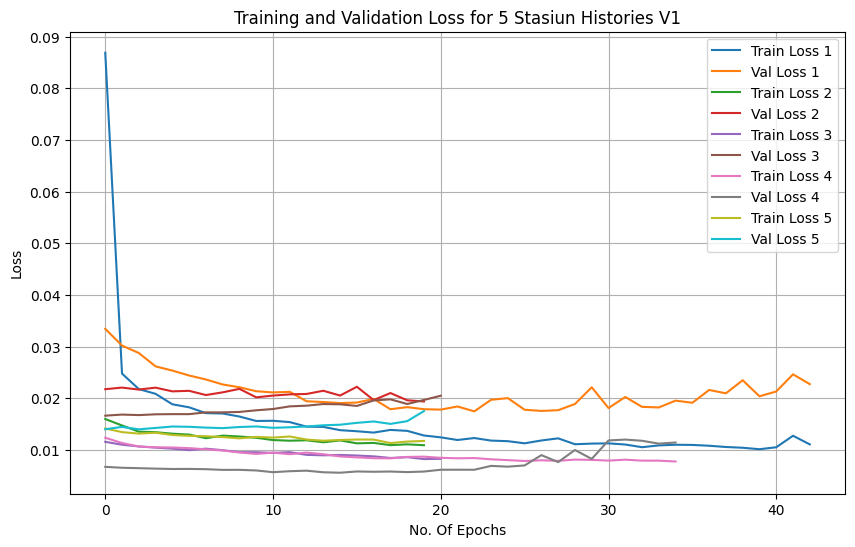

In [ ]:
histories = [history1, history2, history3, history4, history5]

# Set up the plot
plt.figure(figsize=(10, 6))

# Plotting each history's loss and validation loss
for i, hist in enumerate(histories, 1):
    plt.plot(hist.history["loss"], label=f"Train Loss {i}")
    plt.plot(hist.history["val_loss"], label=f"Val Loss {i}")

# Customize the plot
plt.legend(loc='upper right')
plt.xlabel("No. Of Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss for 5 Stasiun Histories V1")
plt.grid(True)
plt.show()

# **Train , Val dan Test Loss**

In [ ]:
X_test_list = [X_test1, X_test2, X_test3, X_test4, X_test5]
y_test_list = [y_test1, y_test2, y_test3, y_test4, y_test5]
model = model_CNNLSTM

for i in range(5):
    last_epoch = len(histories[i].history['loss']) - 1

    # Print training and validation loss from the last epoch
    print(f"History {i + 1}:")
    print(f"Training Loss (Epoch {last_epoch + 1}): {histories[i].history['loss'][last_epoch]:.4f}")
    print(f"Validation Loss (Epoch {last_epoch + 1}): {histories[i].history['val_loss'][last_epoch]:.4f}")

    # Evaluate the model and print test loss
    test_loss = model.evaluate(X_test_list[i], y_test_list[i], verbose=1)
    print(f"Test Loss: {test_loss}\n")

History 1:
Training Loss (Epoch 43): 0.0111
Validation Loss (Epoch 43): 0.0227
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0114 - root_mean_squared_error: 0.1068 
Test Loss: [0.01193358562886715, 0.10924094915390015]

History 2:
Training Loss (Epoch 20): 0.0109
Validation Loss (Epoch 20): 0.0194
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0085 - root_mean_squared_error: 0.0921 
Test Loss: [0.009044147096574306, 0.09510072320699692]

History 3:
Training Loss (Epoch 21): 0.0083
Validation Loss (Epoch 21): 0.0205
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0096 - root_mean_squared_error: 0.0977 
Test Loss: [0.010414307937026024, 0.10205051302909851]

History 4:
Training Loss (Epoch 35): 0.0078
Validation Loss (Epoch 35): 0.0114
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0033 - root_mean_squared_error: 0.0572 
Test Loss: [0.003509116591885686, 0.05923779681324959]

History 5:
Training Loss (Epoch 20): 0.0117
Validation Loss (Epoch 20): 0.0175
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/st

# **EVALUASI MODEL**

In [ ]:
def evaluate_model (model, x, y):
  y_pred = model.predict(x)

  mae_metric = MeanAbsoluteError()
  mse_metric = MeanSquaredError()

  # Calculate various metrics
  mae = mae_metric(y, y_pred)
  mse = mse_metric(y, y_pred)
  rmse = tf.sqrt(mse)

  return mae.numpy(), mse.numpy(), rmse.numpy()

In [ ]:
mae_dki1, mse_dki1, rmse_dki1 = evaluate_model(model_CNNLSTM, X_test1, y_test1)
mae_dki2, mse_dki2, rmse_dki2 = evaluate_model(model_CNNLSTM, X_test2, y_test2)
mae_dki3, mse_dki3, rmse_dki3 = evaluate_model(model_CNNLSTM, X_test3, y_test3)
mae_dki4, mse_dki4, rmse_dki4 = evaluate_model(model_CNNLSTM, X_test4, y_test4)
mae_dki5, mse_dki5, rmse_dki5 = evaluate_model(model_CNNLSTM, X_test5, y_test5)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


In [ ]:
tabel_eval= pd.DataFrame({'Stasiun' :['Stasiun 1', 'Stasiun 2', 'Stasiun 3', 'Stasiun 4', 'Stasiun 5'],
                          'MAE' : [mae_dki1, mae_dki2, mae_dki3, mae_dki4, mae_dki5],
                          'MSE': [mse_dki1, mse_dki2, mse_dki3, mse_dki4, mse_dki5],
                          'RMSE' : [rmse_dki1, rmse_dki2, rmse_dki3, rmse_dki4, rmse_dki5]
                          })

tabel_eval

,Stasiun,MAE,MSE,RMSE
0,Stasiun 1,0.087592,0.011934,0.109241
1,Stasiun 2,0.071887,0.009044,0.095101
2,Stasiun 3,0.067344,0.010414,0.102051
3,Stasiun 4,0.040384,0.003509,0.059238
4,Stasiun 5,0.070173,0.008558,0.092507


# Visualisasi Nilai Aktual dan Prediksi dki1

In [ ]:
predictions1=model_CNNLSTM.predict(X_test1)

df_pred1=pd.DataFrame(predictions1)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step


In [ ]:
predictions1[0]

array([0.29974625, 0.42726612, 0.04015077, 0.43121025, 0.51908505,
       0.27601454], dtype=float32)

In [ ]:
df_final1=test_dki1[WINDOW_SIZE:]

In [ ]:
df_final1[["pm10_pred", "pm25_pred", "so2_pred", "co_pred", "o3_pred", "no2_pred"]]=predictions1
df_final1

<ipython-input-35-692615ea4221>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_final1[["pm10_pred", "pm25_pred", "so2_pred", "co_pred", "o3_pred", "no2_pred"]]=predictions1
<ipython-input-35-692615ea4221>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_final1[["pm10_pred", "pm25_pred", "so2_pred", "co_pred", "o3_pred", "no2_pred"]]=predictions1
<ipython-input-35-692615ea4221>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,co

,pm10,pm25,so2,co,o3,no2,pm10_pred,pm25_pred,so2_pred,co_pred,o3_pred,no2_pred
tanggal,,,,,,,,,,,,
2024-04-15,0.133333,0.283019,0.000000,0.400,0.396552,0.287671,0.299746,0.427266,0.040151,0.431210,0.519085,0.276015
2024-04-16,0.216667,0.339623,0.038835,0.350,0.362069,0.219178,0.260055,0.404200,0.053050,0.430749,0.514068,0.275032
2024-04-17,0.450000,0.500000,0.029126,0.450,0.534483,0.383562,0.254401,0.410662,0.061855,0.395128,0.487854,0.233204
2024-04-18,0.416667,0.415094,0.019417,0.525,0.500000,0.452055,0.379789,0.503299,0.083237,0.426017,0.542522,0.268691
2024-04-19,0.366667,0.415094,0.048544,0.450,0.362069,0.465753,0.388709,0.499771,0.097553,0.465968,0.514232,0.328425
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-06-26,0.533333,0.462264,0.038835,0.675,0.327586,0.342466,0.547838,0.550488,0.090689,0.569799,0.315885,0.351049
2024-06-27,0.616667,0.547170,0.048544,0.550,0.327586,0.383562,0.520278,0.518281,0.079402,0.601955,0.297259,0.312202
2024-06-28,0.566667,0.481132,0.029126,0.600,0.344828,0.397260,0.546373,0.543045,0.087372,0.595476,0.302593,0.328604


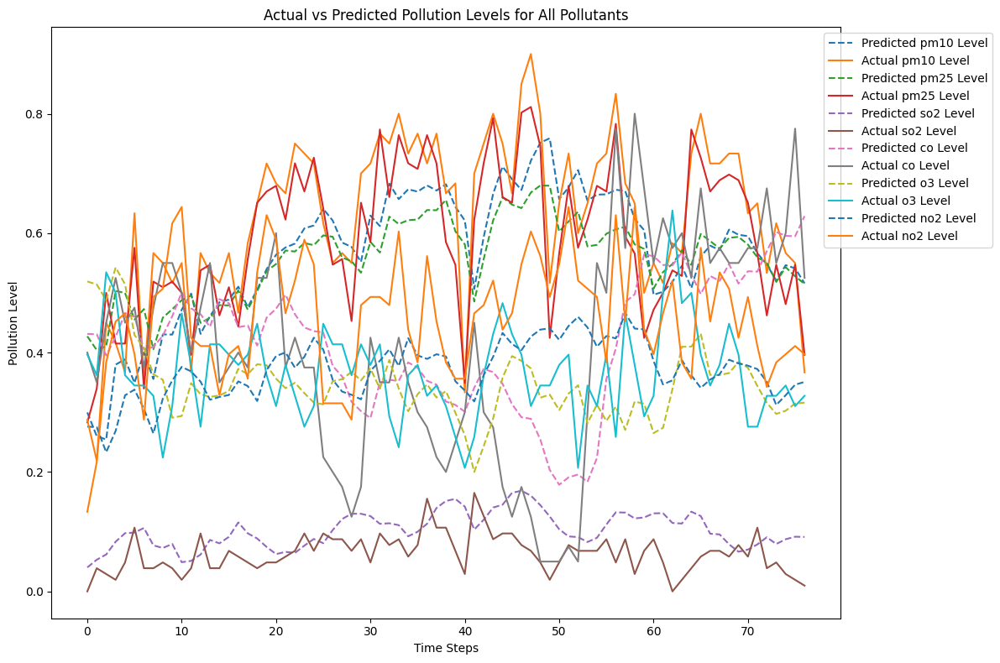

In [ ]:
fig, ax = plt.subplots(figsize=(12, 8))

# Plot predicted and actual pollution levels for all pollutants in the same graph
for i, polutan in enumerate(polutan_column):
    ax.plot(df_pred1[i].values, label=f'Predicted {polutan} Level', linestyle='--')
    ax.plot(df_final1[polutan].values, label=f'Actual {polutan} Level')

ax.set_title('Actual vs Predicted Pollution Levels for All Pollutants')
ax.set_xlabel('Time Steps')
ax.set_ylabel('Pollution Level')
ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.tight_layout()
plt.show()

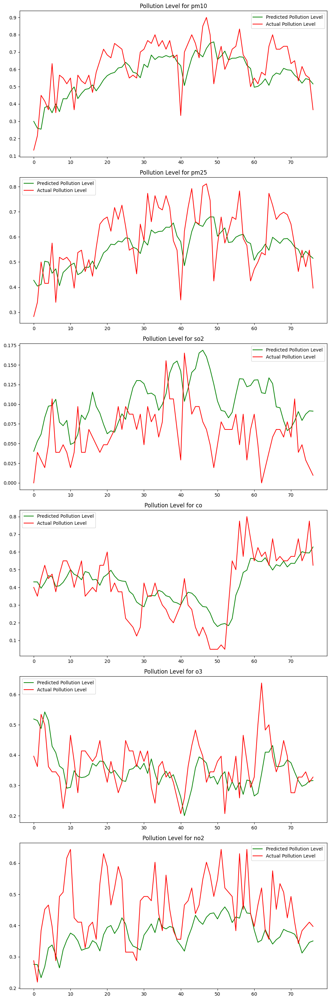

In [ ]:
fig, axes = plt.subplots(nrows=len(polutan_column), ncols=1, figsize=(10, 30))

for i, polutan in enumerate(polutan_column):
    ax = axes[i]  # Akses subplot berdasarkan index
    ax.plot(df_pred1[i].values, color='green', label='Predicted Pollution Level')
    ax.plot(df_final1[polutan].values, color='red', label='Actual Pollution Level')
    ax.set_title(f'Pollution Level for {polutan}')  #judul untuk setiap subplot
    ax.legend()

plt.tight_layout()
plt.show()

In [ ]:
rev_trans1=scaler.inverse_transform(df_final1.iloc[:, :6])
rev_trans1_pred=scaler.inverse_transform(df_final1.iloc[:, -6:])

In [ ]:
df_final1_denormalisasi = pd.DataFrame(rev_trans1, columns=polutan_column)
df_final1_denormalisasi[["pm10_pred", "pm25_pred", "so2_pred", "co_pred", "o3_pred", "no2_pred"]] = rev_trans1_pred

In [ ]:
df_final1_denormalisasi

,pm10,pm25,so2,co,o3,no2,pm10_pred,pm25_pred,so2_pred,co_pred,o3_pred,no2_pred
0,21.533333,53.962264,6.151515,24.000,51.034483,19.410959,34.679955,71.271935,8.032517,25.716564,64.023018,18.664930
1,28.116667,60.754717,7.970874,21.250,47.379310,15.027397,31.544329,68.503983,8.636845,25.691183,63.491249,18.602058
2,46.550000,80.000000,7.516034,26.750,65.655172,25.547945,31.097643,69.279442,9.049317,23.732065,60.712490,15.925055
3,43.916667,69.811321,7.061194,30.875,62.000000,29.931507,41.003334,80.395836,10.051037,25.430941,66.507339,18.196236
4,39.966667,69.811321,8.425713,26.750,47.379310,30.808219,41.708000,79.972572,10.721708,27.628252,63.508560,22.019186
...,...,...,...,...,...,...,...,...,...,...,...,...
72,53.133333,75.471698,7.970874,39.125,43.724138,22.917808,54.279194,86.058594,10.400147,33.338932,42.483765,23.467136
73,59.716667,85.660377,8.425713,32.250,43.724138,25.547945,52.101929,82.193695,9.871359,35.107552,40.509418,20.980904
74,55.766667,77.735849,7.516034,35.000,45.551724,26.424658,54.163506,85.165390,10.244744,34.751190,41.074844,22.030661
75,54.450000,85.660377,7.061194,44.625,41.896552,27.301370,53.749317,83.337898,10.443437,34.712772,42.352852,23.158823


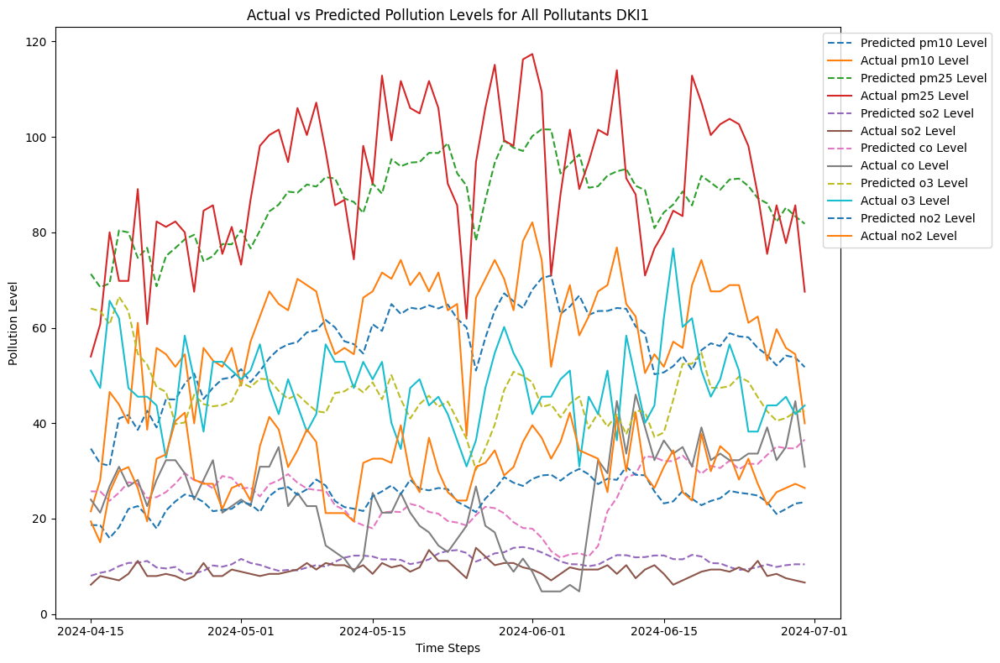

In [ ]:
fig, ax = plt.subplots(figsize=(12, 8))

# Plot predicted and actual pollution levels for all pollutants in the same graph
for i, polutan in enumerate(polutan_column):
  ax.plot(df_final1.index, df_final1_denormalisasi.iloc[:, i+6].values, label=f'Predicted {polutan} Level', linestyle='--')
  ax.plot(df_final1.index, df_final1_denormalisasi[polutan].values, label=f'Actual {polutan} Level')

ax.set_title('Actual vs Predicted Pollution Levels for All Pollutants DKI1')
ax.set_xlabel('Time Steps')
ax.set_ylabel('Pollution Level')
ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.tight_layout()
plt.show()

# Visualisasi Nilai Aktual dan Prediksi dki2

In [ ]:
predictions2=model_CNNLSTM.predict(X_test2)

df_pred2=pd.DataFrame(predictions2)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


In [ ]:
predictions2[0]

array([0.28988147, 0.38249004, 0.6546401 , 0.17900011, 0.08131632,
       0.24877083], dtype=float32)

In [ ]:
df_final2=test_dki2[WINDOW_SIZE:]

In [ ]:
df_final2[["pm10_pred", "pm25_pred", "so2_pred", "co_pred", "o3_pred", "no2_pred"]]=predictions2
df_final2

<ipython-input-47-ba92e9b6e391>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_final2[["pm10_pred", "pm25_pred", "so2_pred", "co_pred", "o3_pred", "no2_pred"]]=predictions2
<ipython-input-47-ba92e9b6e391>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_final2[["pm10_pred", "pm25_pred", "so2_pred", "co_pred", "o3_pred", "no2_pred"]]=predictions2
<ipython-input-47-ba92e9b6e391>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,co

,pm10,pm25,so2,co,o3,no2,pm10_pred,pm25_pred,so2_pred,co_pred,o3_pred,no2_pred
tanggal,,,,,,,,,,,,
2024-04-15,0.197368,0.308411,0.6625,0.153846,0.064327,0.2625,0.289881,0.382490,0.654640,0.179000,0.081316,0.248771
2024-04-16,0.236842,0.327103,0.6625,0.076923,0.064327,0.1500,0.314380,0.401992,0.656022,0.189647,0.099964,0.275368
2024-04-17,0.407895,0.420561,0.6500,0.057692,0.128655,0.0625,0.294371,0.378182,0.653800,0.167774,0.088082,0.242536
2024-04-18,0.447368,0.448598,0.6625,0.192308,0.076023,0.2750,0.377313,0.448905,0.672009,0.132462,0.156323,0.218166
2024-04-19,0.434211,0.392523,0.6625,0.096154,0.058480,0.2000,0.408684,0.452605,0.669508,0.155212,0.156031,0.274051
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-06-26,0.592105,0.504673,0.6875,0.269231,0.011696,0.5875,0.528193,0.571881,0.625507,0.148001,0.100105,0.237014
2024-06-27,0.736842,0.691589,0.6875,0.134615,0.035088,0.2250,0.521129,0.559919,0.604631,0.197851,0.080797,0.316581
2024-06-28,0.539474,0.495327,0.6875,0.134615,0.023392,0.2000,0.543415,0.578597,0.604168,0.147488,0.095016,0.270171


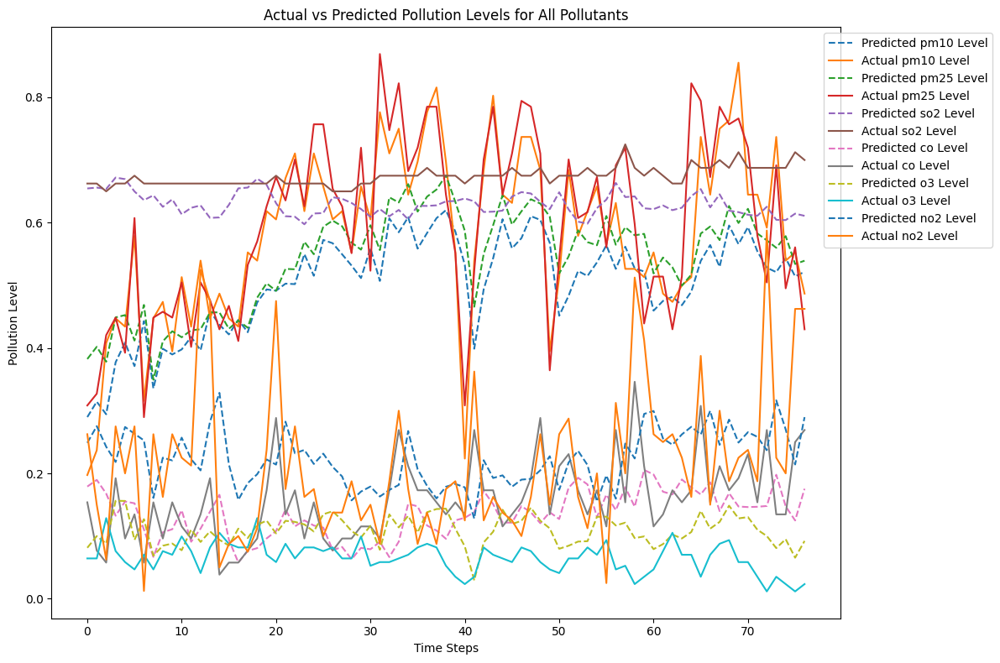

In [ ]:
fig, ax = plt.subplots(figsize=(12, 8))

# Plot predicted and actual pollution levels for all pollutants in the same graph
for i, polutan in enumerate(polutan_column):
    ax.plot(df_pred2[i].values, label=f'Predicted {polutan} Level', linestyle='--')
    ax.plot(df_final2[polutan].values, label=f'Actual {polutan} Level')

ax.set_title('Actual vs Predicted Pollution Levels for All Pollutants')
ax.set_xlabel('Time Steps')
ax.set_ylabel('Pollution Level')
ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.tight_layout()
plt.show()

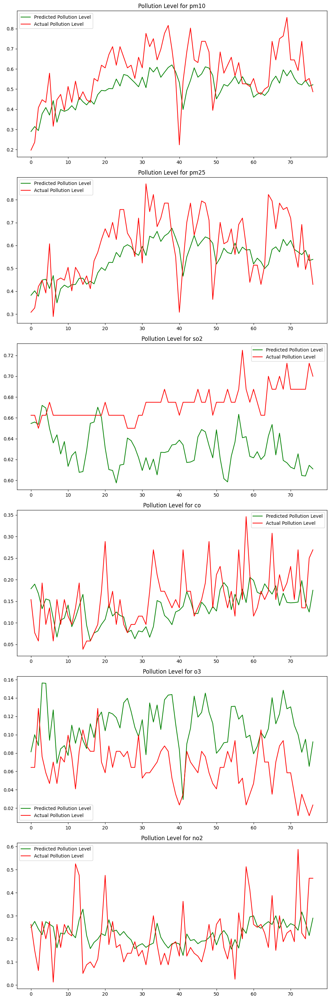

In [ ]:
fig, axes = plt.subplots(nrows=len(polutan_column), ncols=1, figsize=(10, 30))

for i, polutan in enumerate(polutan_column):
    ax = axes[i]  # Akses subplot berdasarkan index
    ax.plot(df_pred2[i].values, color='green', label='Predicted Pollution Level')
    ax.plot(df_final2[polutan].values, color='red', label='Actual Pollution Level')
    ax.set_title(f'Pollution Level for {polutan}')  #judul untuk setiap subplot
    ax.legend()

plt.tight_layout()
plt.show()

In [ ]:
rev_trans2=scaler.inverse_transform(df_final2.iloc[:, :6])
rev_trans2_pred=scaler.inverse_transform(df_final2.iloc[:, -6:])

In [ ]:
df_final2_denormalisasi = pd.DataFrame(rev_trans2, columns=polutan_column)
df_final2_denormalisasi[["pm10_pred", "pm25_pred", "so2_pred", "co_pred", "o3_pred", "no2_pred"]] = rev_trans2_pred

In [ ]:
df_final2_denormalisasi

,pm10,pm25,so2,co,o3,no2,pm10_pred,pm25_pred,so2_pred,co_pred,o3_pred,no2_pred
0,26.592105,57.009346,37.188636,10.461538,15.818713,17.8,34.917465,63.307556,35.222904,11.141534,20.615362,16.618216
1,29.710526,59.252336,37.188636,6.230769,15.818713,10.6,36.568050,65.508568,35.702614,11.068695,22.078773,18.099413
2,43.223684,70.467290,36.603030,5.173077,22.637427,5.0,34.255127,60.310707,35.369083,10.174382,19.879471,15.838957
3,46.342105,73.831776,37.188636,12.576923,17.058480,18.6,40.649311,69.921387,36.614277,7.802532,25.001015,14.501457
4,45.302632,67.102804,37.188636,7.288462,15.198830,13.8,43.729542,73.528862,36.443130,8.897495,25.433828,17.909649
...,...,...,...,...,...,...,...,...,...,...,...,...
72,57.776316,80.560748,38.359848,16.807692,10.239766,38.6,53.634888,87.484253,35.105488,10.061279,16.196690,15.918036
73,69.210526,102.990654,38.359848,9.403846,12.719298,15.4,54.551205,88.671684,34.020683,11.992754,15.918647,21.925797
74,53.618421,79.439252,38.359848,9.403846,11.479532,13.8,55.217205,89.714745,33.915291,9.900259,15.969567,18.484362
75,54.657895,87.289720,39.531061,15.750000,10.239766,30.6,52.774715,84.790649,34.219574,9.504145,16.228111,16.477060


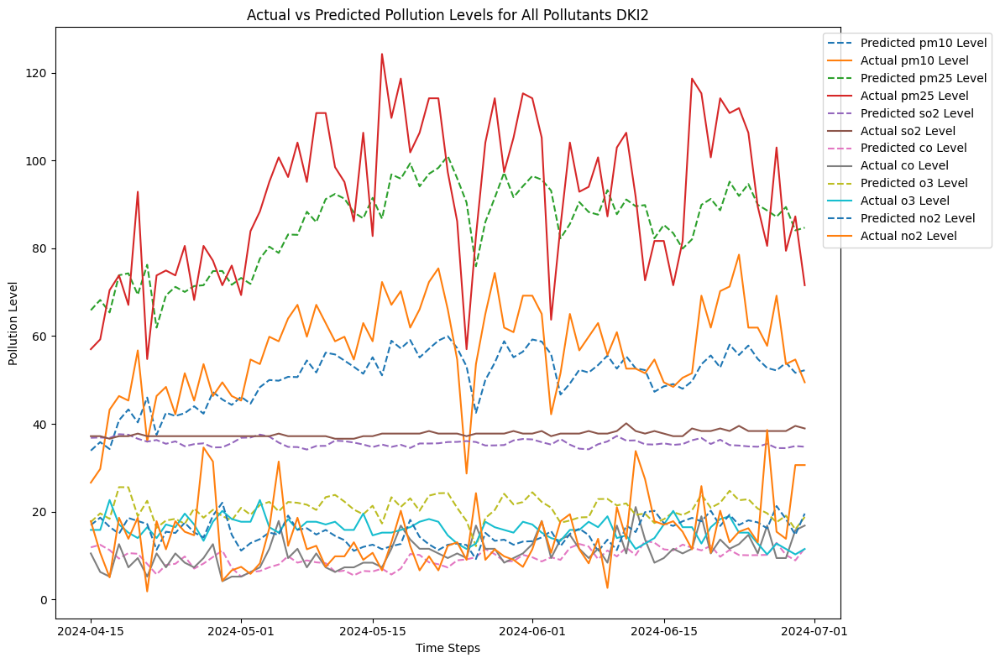

In [ ]:
fig, ax = plt.subplots(figsize=(12, 8))

# Plot predicted and actual pollution levels for all pollutants in the same graph
for i, polutan in enumerate(polutan_column):
  ax.plot(df_final2.index, df_final2_denormalisasi.iloc[:, i+6].values, label=f'Predicted {polutan} Level', linestyle='--')
  ax.plot(df_final2.index, df_final2_denormalisasi[polutan].values, label=f'Actual {polutan} Level')

ax.set_title('Actual vs Predicted Pollution Levels for All Pollutants DKI2')
ax.set_xlabel('Time Steps')
ax.set_ylabel('Pollution Level')
ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.tight_layout()
plt.show()

# Visualisasi Nilai Aktual dan Prediksi dki3

In [ ]:
predictions3=model_CNNLSTM.predict(X_test3)

df_pred3=pd.DataFrame(predictions3)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


In [ ]:
predictions3[0]

array([0.42161447, 0.40967995, 0.5556273 , 0.17113633, 0.08973017,
       0.18486449], dtype=float32)

In [ ]:
df_final3=test_dki3[WINDOW_SIZE:]

In [ ]:
df_final3[["pm10_pred", "pm25_pred", "so2_pred", "co_pred", "o3_pred", "no2_pred"]]=predictions3
df_final3

<ipython-input-101-c7a7bf89a06e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_final3[["pm10_pred", "pm25_pred", "so2_pred", "co_pred", "o3_pred", "no2_pred"]]=predictions3
<ipython-input-101-c7a7bf89a06e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_final3[["pm10_pred", "pm25_pred", "so2_pred", "co_pred", "o3_pred", "no2_pred"]]=predictions3
<ipython-input-101-c7a7bf89a06e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer

,pm10,pm25,so2,co,o3,no2,pm10_pred,pm25_pred,so2_pred,co_pred,o3_pred,no2_pred
tanggal,,,,,,,,,,,,
2024-04-26,0.406593,0.381679,0.573171,0.115942,0.074324,0.138614,0.421614,0.409680,0.555627,0.171136,0.089730,0.184864
2024-04-27,0.494505,0.404580,0.573171,0.188406,0.040541,0.311881,0.406827,0.412086,0.559215,0.169701,0.079596,0.177814
2024-04-28,0.516484,0.442748,0.573171,0.217391,0.054054,0.336634,0.434056,0.424535,0.549419,0.176086,0.084706,0.222832
2024-04-29,0.571429,0.022901,0.573171,0.144928,0.074324,0.133663,0.443886,0.430359,0.543417,0.185353,0.091086,0.252475
2024-04-30,0.593407,0.045802,0.573171,0.115942,0.074324,0.118812,0.365296,0.327453,0.556773,0.128141,0.053496,0.170585
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-06-26,0.516484,0.465649,0.609756,0.173913,0.033784,0.376238,0.543878,0.587598,0.561199,0.143567,0.107497,0.207289
2024-06-27,0.538462,0.496183,0.609756,0.115942,0.054054,0.198020,0.493377,0.535273,0.563531,0.150066,0.091845,0.240306
2024-06-28,0.516484,0.450382,0.609756,0.246377,0.027027,0.311881,0.481096,0.528820,0.566055,0.144403,0.081457,0.230994


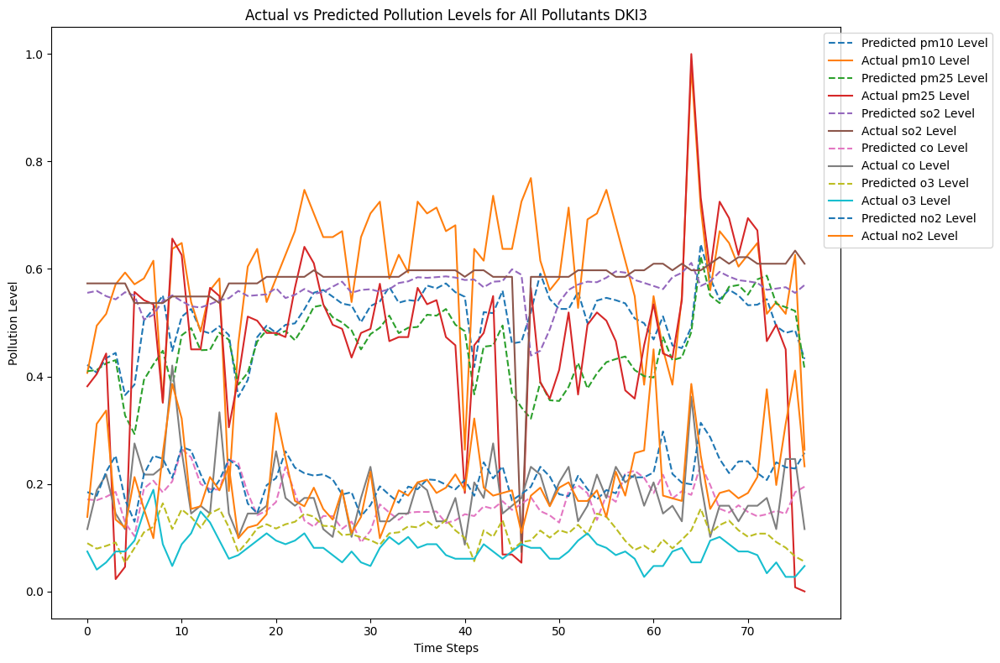

In [ ]:
fig, ax = plt.subplots(figsize=(12, 8))

# Plot predicted and actual pollution levels for all pollutants in the same graph
for i, polutan in enumerate(polutan_column):
    ax.plot(df_pred3[i].values, label=f'Predicted {polutan} Level', linestyle='--')
    ax.plot(df_final3[polutan].values, label=f'Actual {polutan} Level')

ax.set_title('Actual vs Predicted Pollution Levels for All Pollutants DKI3')
ax.set_xlabel('Time Steps')
ax.set_ylabel('Pollution Level')
ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.tight_layout()
plt.show()

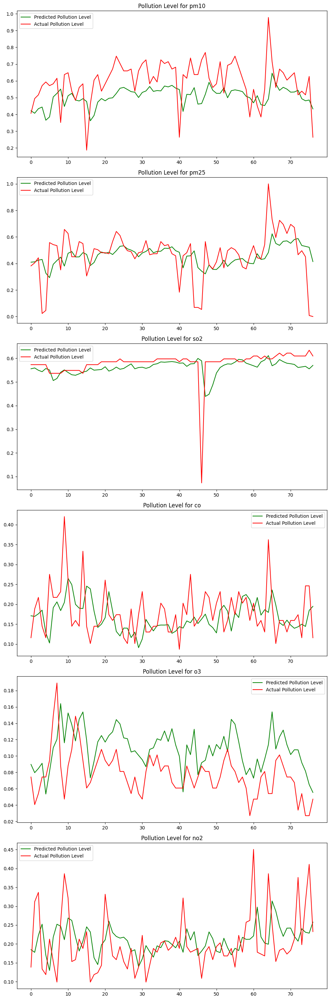

In [ ]:
fig, axes = plt.subplots(nrows=len(polutan_column), ncols=1, figsize=(10, 30))

for i, polutan in enumerate(polutan_column):
    ax = axes[i]  # Akses subplot berdasarkan index
    ax.plot(df_pred3[i].values, color='green', label='Predicted Pollution Level')
    ax.plot(df_final3[polutan].values, color='red', label='Actual Pollution Level')
    ax.set_title(f'Pollution Level for {polutan}')  #judul untuk setiap subplot
    ax.legend()

plt.tight_layout()
plt.show()

In [ ]:
rev_trans3=scaler.inverse_transform(df_final3.iloc[:, :6])
rev_trans3_pred=scaler.inverse_transform(df_final3.iloc[:, -6:])

In [ ]:
df_final3_denormalisasi = pd.DataFrame(rev_trans3, columns=polutan_column)
df_final3_denormalisasi[["pm10_pred", "pm25_pred", "so2_pred", "co_pred", "o3_pred", "no2_pred"]] = rev_trans3_pred

In [ ]:
df_final3_denormalisasi

,pm10,pm25,so2,co,o3,no2,pm10_pred,pm25_pred,so2_pred,co_pred,o3_pred,no2_pred
0,43.120879,65.801527,33.003695,8.376812,16.878378,9.871287,44.307541,69.161598,32.181812,11.412498,18.511398,12.831327
1,50.065934,68.549618,33.003695,12.362319,13.297297,20.960396,43.139317,69.450287,32.349903,11.333573,17.437208,12.380096
2,51.802198,73.129771,33.003695,13.956522,14.729730,22.544554,45.290432,70.944252,31.890976,11.684752,17.978832,15.261234
3,56.142857,22.748092,33.003695,9.971014,16.878378,9.554455,46.067017,71.643051,31.609755,12.194396,18.655104,17.158422
4,57.879121,25.496183,33.003695,8.376812,16.878378,8.603960,39.858395,59.294399,32.235497,9.047768,14.670623,11.917435
...,...,...,...,...,...,...,...,...,...,...,...,...
72,51.802198,75.877863,34.717664,11.565217,12.581081,25.079208,53.966324,90.511818,32.442852,9.896193,20.394659,14.266514
73,53.538462,79.541985,34.717664,8.376812,14.729730,13.673267,49.976799,84.232742,32.552086,10.253610,18.735588,16.379581
74,51.802198,74.045802,34.717664,15.550725,11.864865,20.960396,49.006573,83.458351,32.670330,9.942167,17.634411,15.783646
75,60.483516,20.916031,35.860310,15.550725,11.864865,27.297030,49.369316,82.630363,32.173145,12.157823,15.896498,15.634272


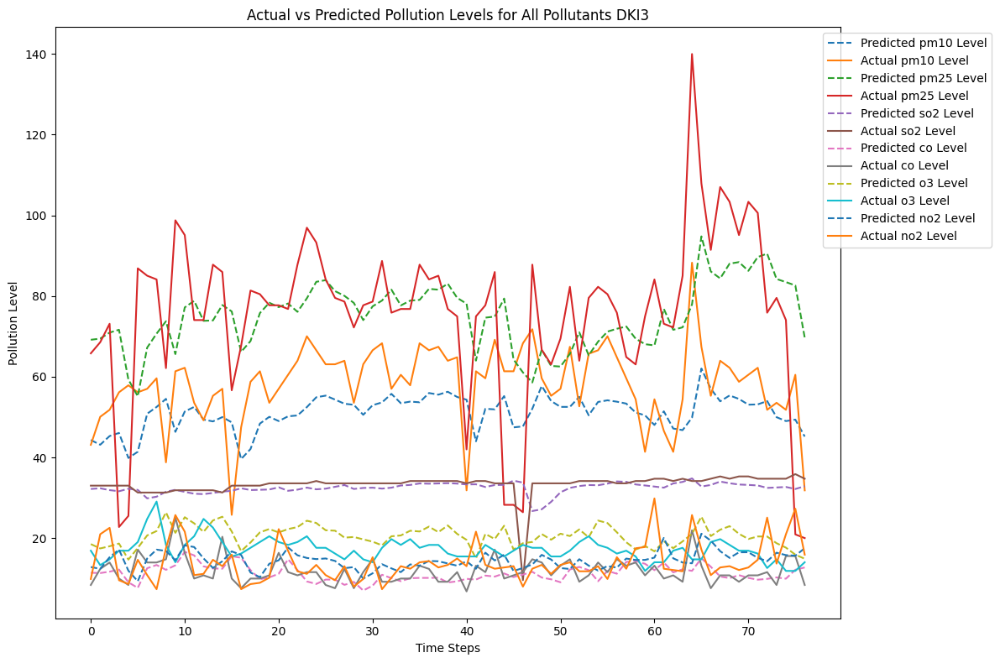

In [ ]:
fig, ax = plt.subplots(figsize=(12, 8))

# Plot predicted and actual pollution levels for all pollutants in the same graph
for i, polutan in enumerate(polutan_column):
  ax.plot(df_final3_denormalisasi.iloc[:, i+6].values, label=f'Predicted {polutan} Level', linestyle='--')
  ax.plot(df_final3_denormalisasi[polutan].values, label=f'Actual {polutan} Level')

ax.set_title('Actual vs Predicted Pollution Levels for All Pollutants DKI3')
ax.set_xlabel('Time Steps')
ax.set_ylabel('Pollution Level')
ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.tight_layout()
plt.show()

# Visualisasi Nilai Aktual dan Prediksi dki4

In [ ]:
predictions4=model_CNNLSTM.predict(X_test4)

df_pred4=pd.DataFrame(predictions4)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 181ms/step


In [ ]:
predictions4[0]

array([0.19578263, 0.24002069, 0.35774788, 0.3966157 , 0.08413631,
       0.13751155], dtype=float32)

In [ ]:
df_final4=test_dki4[WINDOW_SIZE:]

In [ ]:
df_final4[["pm10_pred", "pm25_pred", "so2_pred", "co_pred", "o3_pred", "no2_pred"]]=predictions4
df_final4

<ipython-input-112-f68dfb2f9891>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_final4[["pm10_pred", "pm25_pred", "so2_pred", "co_pred", "o3_pred", "no2_pred"]]=predictions4
<ipython-input-112-f68dfb2f9891>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_final4[["pm10_pred", "pm25_pred", "so2_pred", "co_pred", "o3_pred", "no2_pred"]]=predictions4
<ipython-input-112-f68dfb2f9891>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer

,pm10,pm25,so2,co,o3,no2,pm10_pred,pm25_pred,so2_pred,co_pred,o3_pred,no2_pred
tanggal,,,,,,,,,,,,
2024-04-15,0.103030,0.144332,0.367347,0.354167,0.052239,0.08,0.195783,0.240021,0.357748,0.396616,0.084136,0.137512
2024-04-16,0.175758,0.181056,0.367347,0.312500,0.059701,0.08,0.176800,0.219298,0.357157,0.374012,0.082032,0.138957
2024-04-17,0.224242,0.225125,0.367347,0.333333,0.119403,0.12,0.185430,0.225060,0.350568,0.369696,0.086386,0.119759
2024-04-18,0.230303,0.192073,0.367347,0.416667,0.082090,0.16,0.240121,0.269952,0.360344,0.377827,0.130871,0.133526
2024-04-19,0.181818,0.181056,0.367347,0.416667,0.067164,0.14,0.234581,0.256275,0.373060,0.407012,0.123099,0.172682
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-06-26,0.345455,0.239814,0.632653,0.541667,0.037313,0.28,0.300000,0.301630,0.563005,0.402924,0.081450,0.288746
2024-06-27,0.357576,0.261849,0.632653,0.395833,0.119403,0.22,0.304250,0.283296,0.552228,0.431527,0.070335,0.284293
2024-06-28,0.296970,0.217780,0.612245,0.520833,0.104478,0.14,0.319672,0.294128,0.556796,0.426348,0.096269,0.273227


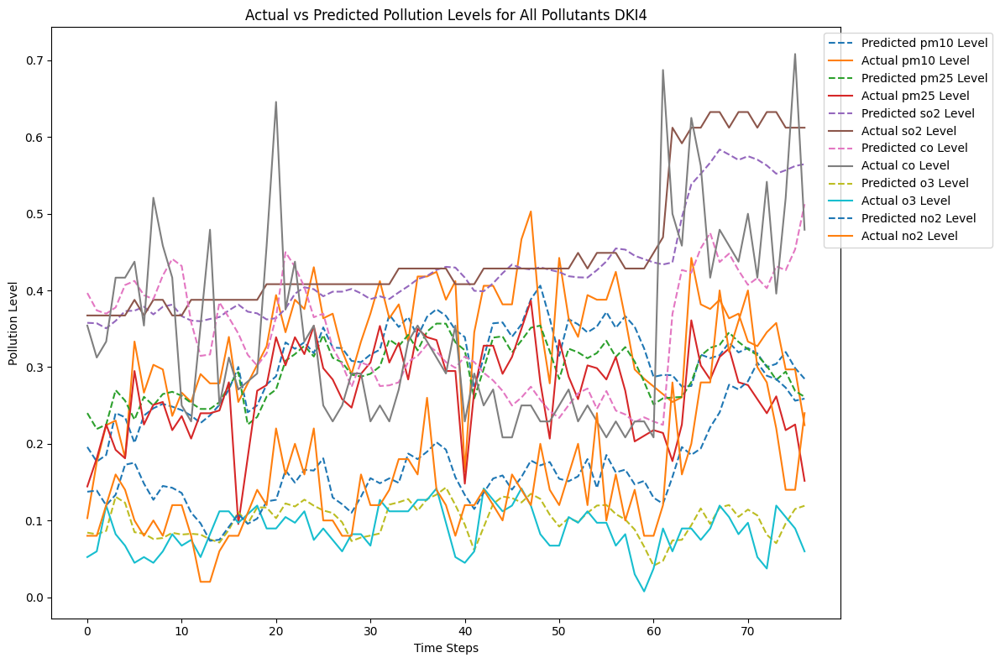

In [ ]:
fig, ax = plt.subplots(figsize=(12, 8))

# Plot predicted and actual pollution levels for all pollutants in the same graph
for i, polutan in enumerate(polutan_column):
    ax.plot(df_pred4[i].values, label=f'Predicted {polutan} Level', linestyle='--')
    ax.plot(df_final4[polutan].values, label=f'Actual {polutan} Level')

ax.set_title('Actual vs Predicted Pollution Levels for All Pollutants DKI4')
ax.set_xlabel('Time Steps')
ax.set_ylabel('Pollution Level')
ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.tight_layout()
plt.show()

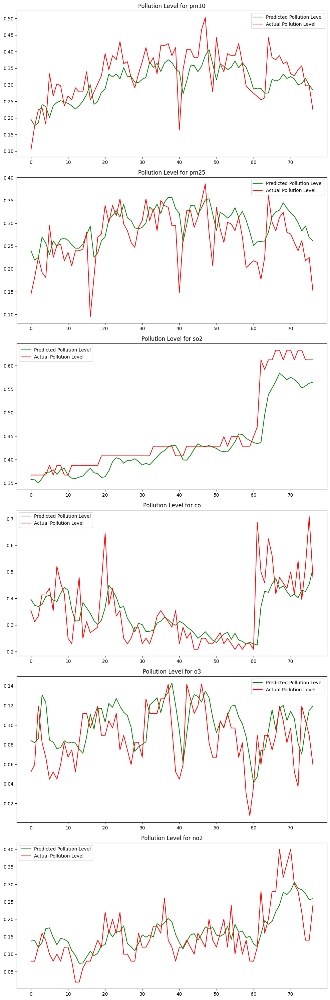

In [ ]:
fig, axes = plt.subplots(nrows=len(polutan_column), ncols=1, figsize=(10, 30))

for i, polutan in enumerate(polutan_column):
    ax = axes[i]  # Akses subplot berdasarkan index
    ax.plot(df_pred4[i].values, color='green', label='Predicted Pollution Level')
    ax.plot(df_final4[polutan].values, color='red', label='Actual Pollution Level')
    ax.set_title(f'Pollution Level for {polutan}')  #judul untuk setiap subplot
    ax.legend()

plt.tight_layout()
plt.show()

In [ ]:
rev_trans4=scaler.inverse_transform(df_final4.iloc[:, :6])
rev_trans4_pred=scaler.inverse_transform(df_final4.iloc[:, -6:])

In [ ]:
df_final4_denormalisasi = pd.DataFrame(rev_trans4, columns=polutan_column)
df_final4_denormalisasi[["pm10_pred", "pm25_pred", "so2_pred", "co_pred", "o3_pred", "no2_pred"]] = rev_trans4_pred

In [ ]:
df_final4_denormalisasi.iloc[5:13]

,pm10,pm25,so2,co,o3,no2,pm10_pred,pm25_pred,so2_pred,co_pred,o3_pred,no2_pred
5,37.333333,55.388027,24.317254,26.062500,13.746269,7.40,26.892265,47.769501,23.654026,24.683788,17.976093,12.221523
6,32.066667,47.014967,23.361163,21.479167,14.537313,6.12,29.706106,51.350441,23.893818,23.656654,17.763634,10.479600
7,34.939394,50.099778,24.317254,30.645833,13.746269,7.40,30.459812,49.991524,23.427197,23.376869,17.037102,9.124629
8,34.460606,50.540466,24.317254,27.208333,15.328358,6.12,30.909542,51.782352,23.891247,25.069799,17.175787,10.279772
9,29.672727,46.133592,23.361163,24.916667,17.701493,8.68,30.624947,52.137661,24.025848,26.258745,17.898344,10.126007
10,32.066667,48.337029,23.361163,15.750000,16.119403,8.68,30.263624,51.511448,23.320957,25.752356,17.655184,9.693664
11,31.109091,44.811530,24.317254,14.604167,16.910448,6.12,29.699139,50.391464,23.049332,21.723982,17.759604,8.055398
12,33.981818,48.777716,24.317254,21.479167,14.537313,2.28,28.939716,49.449673,23.008799,19.305424,17.651762,7.159879


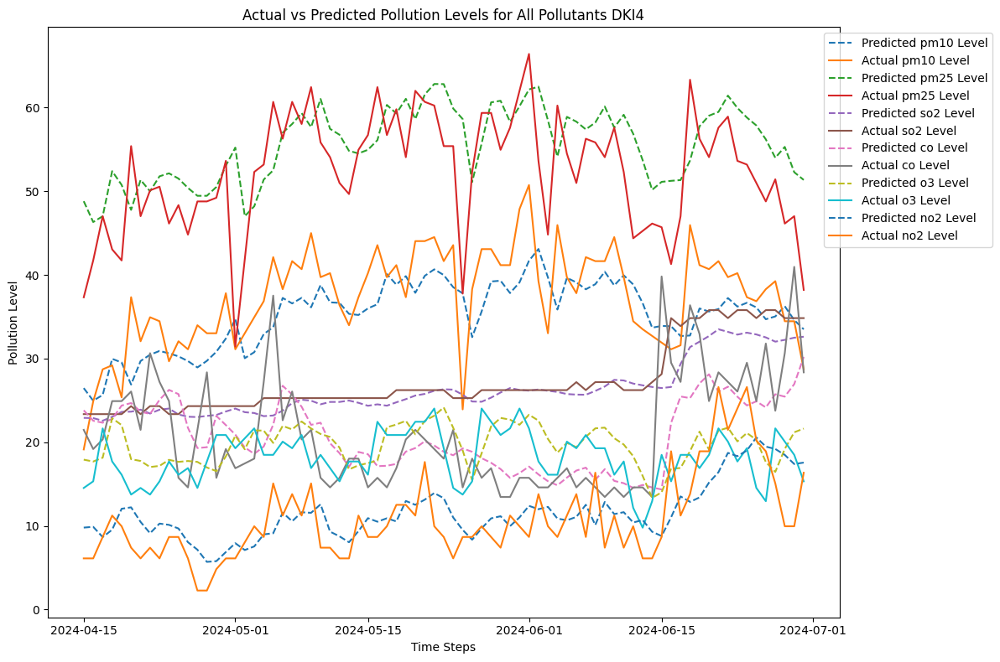

In [ ]:
fig, ax = plt.subplots(figsize=(12, 8))

# Plot predicted and actual pollution levels for all pollutants in the same graph
for i, polutan in enumerate(polutan_column):
  ax.plot(df_final4.index, df_final4_denormalisasi.iloc[:, i+6].values, label=f'Predicted {polutan} Level', linestyle='--')
  ax.plot(df_final4.index, df_final4_denormalisasi[polutan].values, label=f'Actual {polutan} Level')

ax.set_title('Actual vs Predicted Pollution Levels for All Pollutants DKI4')
ax.set_xlabel('Time Steps')
ax.set_ylabel('Pollution Level')
ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.tight_layout()
plt.show()

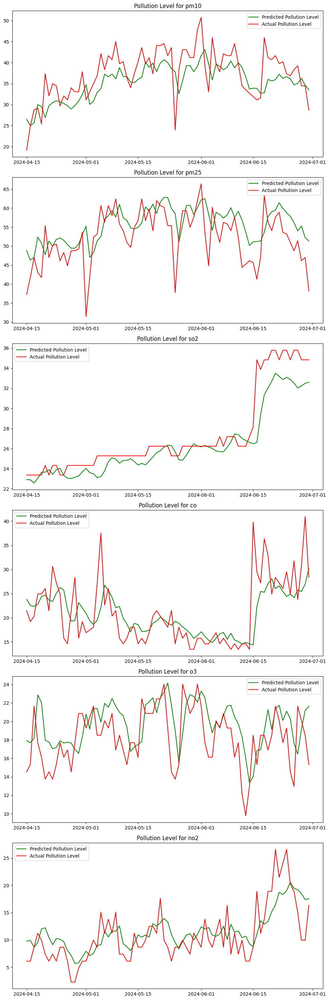

In [ ]:
fig, axes = plt.subplots(nrows=len(polutan_column), ncols=1, figsize=(10, 30))

for i, polutan in enumerate(polutan_column):
    ax = axes[i]
    ax.plot(df_final4.index, df_final4_denormalisasi.iloc[:, i+6].values, color='green', label='Predicted Pollution Level')
    ax.plot(df_final4.index, df_final4_denormalisasi[polutan].values, color='red', label='Actual Pollution Level')
    ax.set_title(f'Pollution Level for {polutan}')
    ax.legend()

plt.tight_layout()
plt.show()

In [ ]:
actual_pm10 = df_final4_denormalisasi['pm10'].values
predicted_pm10 = df_final4_denormalisasi['pm10_pred'].values

# MAE
mae = np.mean(np.abs(actual_pm10 - predicted_pm10))

# MSE
mse = np.mean((actual_pm10 - predicted_pm10) ** 2)

# RMSE
rmse = np.sqrt(mse)

print(f"MAE: {mae}")
print(sum((actual_pm10 - predicted_pm10) ** 2))
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")

MAE: 3.8845680251829
1815.5227098322648
MSE: 23.578217010808633
RMSE: 4.855740624334112


In [ ]:
actual_pm25 = df_final4_denormalisasi['pm25'].values
predicted_pm25 = df_final4_denormalisasi['pm25_pred'].values

# MAE
mae = np.mean(np.abs(actual_pm25 - predicted_pm25))

# MSE
mse = np.mean((actual_pm25 - predicted_pm25) ** 2)

# RMSE
rmse = np.sqrt(mse)

print(f"MAE: {mae}")
print(sum((actual_pm25 - predicted_pm25) ** 2))
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")

MAE: 5.1156584509855225
3447.0840251656955
MSE: 44.767325002151864
RMSE: 6.690838886279646


In [ ]:
actual_so2 = df_final4_denormalisasi['so2'].values
predicted_so2 = df_final4_denormalisasi['so2_pred'].values

# MAE
mae = np.mean(np.abs(actual_so2 - predicted_so2))

# MSE
mse = np.mean((actual_so2 - predicted_so2) ** 2)

# RMSE
rmse = np.sqrt(mse)

print(f"MAE: {mae}")
print(sum((actual_so2 - predicted_so2) ** 2))
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")

mean_actual = np.mean(actual_so2)
rentang_data = max(actual_so2)-min(actual_so2)
Kesalahan_Relatif = (rmse/mean_actual)*100
Kesalahan_Relatif

MAE: 1.1760380046565553
231.25413018055013
MSE: 3.003300391955197
RMSE: 1.7330032867698772


6.354410880709102

In [ ]:
actual_co = df_final4_denormalisasi['co'].values
predicted_co = df_final4_denormalisasi['co_pred'].values

# MAE
mae = np.mean(np.abs(actual_co - predicted_co))

# MSE
mse = np.mean((actual_co - predicted_co) ** 2)

# RMSE
rmse = np.sqrt(mse)

print(f"MAE: {mae}")
print(sum((actual_co - predicted_co) ** 2))
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")

MAE: 3.383447490213237
2129.436849096372
MSE: 27.6550240142386
RMSE: 5.258804428217368


In [ ]:
actual_o3 = df_final4_denormalisasi['o3'].values
predicted_o3 = df_final4_denormalisasi['o3_pred'].values

# MAE
mae = np.mean(np.abs(actual_o3 - predicted_o3))

# MSE
mse = np.mean((actual_o3 - predicted_o3) ** 2)

# RMSE
rmse = np.sqrt(mse)


print(f"MAE: {mae}")
print(sum((actual_o3 - predicted_o3) ** 2))
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")

rentang_data = max(actual_o3)-min(actual_o3)
Kesalahan_Relatif = (rmse/rentang_data)*100
Kesalahan_Relatif

MAE: 2.5852980620178467
780.0919904524123
MSE: 10.13106481107029
RMSE: 3.182933365791733


22.353934539627474

In [ ]:
actual_no2 = df_final4_denormalisasi['no2'].values
predicted_no2 = df_final4_denormalisasi['no2_pred'].values

# MAE
mae = np.mean(np.abs(actual_no2 - predicted_no2))

# MSE
mse = np.mean((actual_no2 - predicted_no2) ** 2)

# RMSE
rmse = np.sqrt(mse)

print(f"MAE: {mae}")
print(sum((actual_no2 - predicted_no2) ** 2))
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")

rentang_data = max(actual_no2)-min(actual_no2)
Kesalahan_Relatif = (rmse/rentang_data)*100
Kesalahan_Relatif

MAE: 2.8580800078751203
1002.9135092705765
MSE: 13.024850769747747
RMSE: 3.608995811821863


14.839620936767528

# Visualisasi Nilai Aktual dan Prediksi dki5

In [ ]:
predictions5=model_CNNLSTM.predict(X_test5)

df_pred5=pd.DataFrame(predictions5)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


In [ ]:
df_final5=test_dki5[WINDOW_SIZE:]

In [ ]:
df_final5[["pm10_pred", "pm25_pred", "so2_pred", "co_pred", "o3_pred", "no2_pred"]]=predictions5
df_final5

<ipython-input-114-6c52ac6fb121>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_final5[["pm10_pred", "pm25_pred", "so2_pred", "co_pred", "o3_pred", "no2_pred"]]=predictions5
<ipython-input-114-6c52ac6fb121>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_final5[["pm10_pred", "pm25_pred", "so2_pred", "co_pred", "o3_pred", "no2_pred"]]=predictions5
<ipython-input-114-6c52ac6fb121>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer

,pm10,pm25,so2,co,o3,no2,pm10_pred,pm25_pred,so2_pred,co_pred,o3_pred,no2_pred
tanggal,,,,,,,,,,,,
2024-04-15,0.240506,0.283333,0.359638,0.327273,0.500000,0.203125,0.345323,0.434635,0.415091,0.331095,0.598469,0.256538
2024-04-16,0.151899,0.275000,0.402329,0.272727,0.481132,0.156250,0.324976,0.417661,0.429464,0.337917,0.574532,0.259363
2024-04-17,0.379747,0.425000,0.359638,0.290909,0.641509,0.203125,0.278478,0.380043,0.435033,0.304001,0.543496,0.227462
2024-04-18,0.417722,0.408333,0.359638,0.345455,0.547170,0.265625,0.372515,0.466279,0.438841,0.308482,0.611156,0.235770
2024-04-19,0.291139,0.341667,0.402329,0.290909,0.452830,0.281250,0.381910,0.467991,0.432519,0.313386,0.574182,0.263914
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-06-26,0.556962,0.533333,0.530401,0.490909,0.188679,0.187500,0.502701,0.549773,0.541270,0.330419,0.287483,0.309744
2024-06-27,0.455696,0.450000,0.594437,0.290909,0.301887,0.234375,0.477341,0.511029,0.520077,0.373824,0.239906,0.276231
2024-06-28,0.443038,0.416667,0.615783,0.400000,0.339623,0.281250,0.463410,0.496710,0.545573,0.356678,0.261456,0.273159


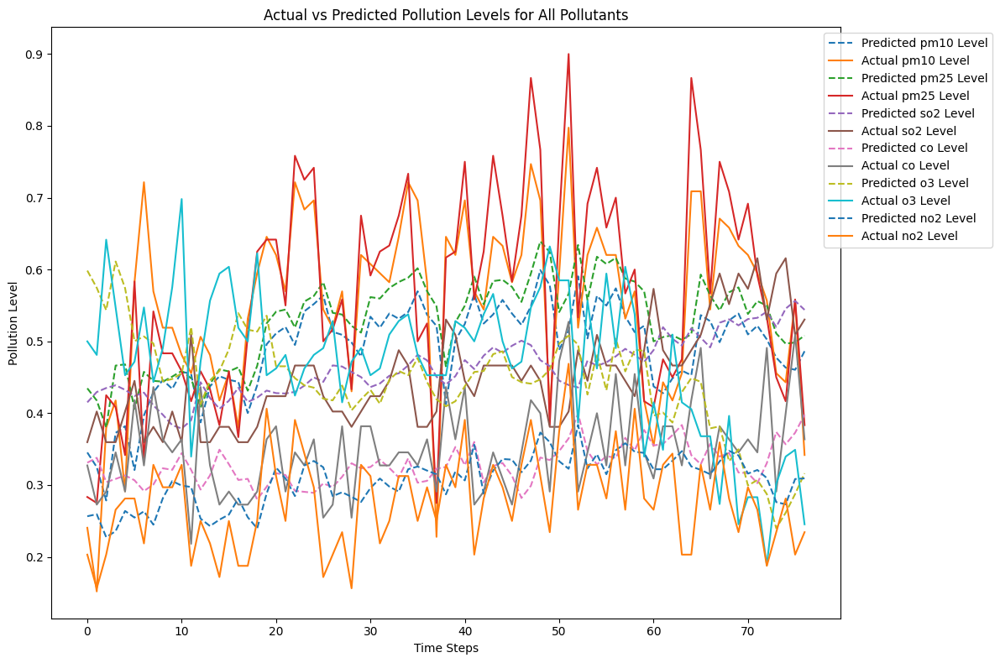

In [ ]:
fig, ax = plt.subplots(figsize=(12, 8))

# Plot predicted and actual pollution levels for all pollutants in the same graph
for i, polutan in enumerate(polutan_column):
    ax.plot(df_pred5[i].values, label=f'Predicted {polutan} Level', linestyle='--')
    ax.plot(df_final5[polutan].values, label=f'Actual {polutan} Level')

ax.set_title('Actual vs Predicted Pollution Levels for All Pollutants')
ax.set_xlabel('Time Steps')
ax.set_ylabel('Pollution Level')
ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.tight_layout()
plt.show()

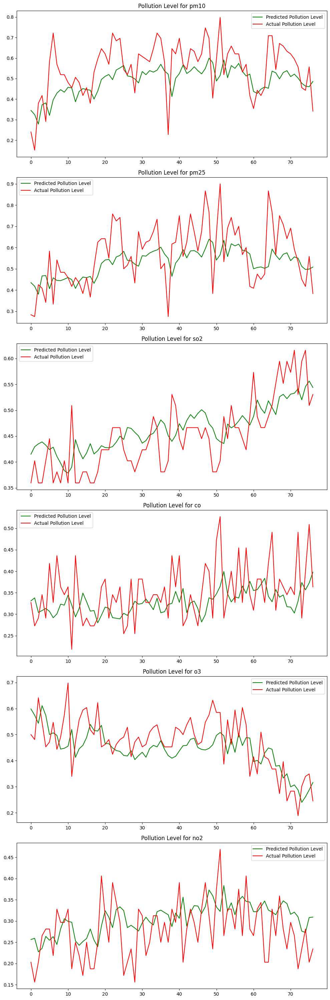

In [ ]:
fig, axes = plt.subplots(nrows=len(polutan_column), ncols=1, figsize=(10, 30))

for i, polutan in enumerate(polutan_column):
    ax = axes[i]  # Akses subplot berdasarkan index
    ax.plot(df_pred5[i].values, color='green', label='Predicted Pollution Level')
    ax.plot(df_final5[polutan].values, color='red', label='Actual Pollution Level')
    ax.set_title(f'Pollution Level for {polutan}')  #judul untuk setiap subplot
    ax.legend()

plt.tight_layout()
plt.show()

In [ ]:
rev_trans5=scaler.inverse_transform(df_final5.iloc[:, :6])
rev_trans5_pred=scaler.inverse_transform(df_final5.iloc[:, -6:])

In [ ]:
df_final5_denormalisasi = pd.DataFrame(rev_trans5, columns=polutan_column)
df_final5_denormalisasi[["pm10_pred", "pm25_pred", "so2_pred", "co_pred", "o3_pred", "no2_pred"]] = rev_trans5_pred

In [ ]:
df_final5_denormalisasi

,pm10,pm25,so2,co,o3,no2,pm10_pred,pm25_pred,so2_pred,co_pred,o3_pred,no2_pred
0,30.0,54.0,23.0,20.0,62.0,14.0,38.280499,72.156204,25.597921,20.210213,72.437721,17.418404
1,23.0,53.0,25.0,17.0,60.0,11.0,36.673138,70.119370,26.271235,20.585459,69.900414,17.599201
2,41.0,71.0,23.0,18.0,77.0,14.0,32.999798,65.605186,26.532173,18.720055,66.610527,15.557586
3,44.0,69.0,23.0,21.0,67.0,18.0,40.428669,75.953514,26.710541,18.966484,73.782555,16.089293
4,34.0,61.0,25.0,18.0,57.0,19.0,41.170872,76.158928,26.414392,19.236242,69.863319,17.890488
...,...,...,...,...,...,...,...,...,...,...,...,...
72,55.0,84.0,31.0,29.0,29.0,13.0,50.713352,85.972717,31.509197,20.173042,39.473156,20.823616
73,47.0,74.0,34.0,18.0,41.0,16.0,48.709919,81.323524,30.516342,22.560301,34.430008,18.678793
74,46.0,70.0,35.0,24.0,45.0,19.0,47.609406,79.605217,31.710764,21.617294,36.714348,18.482185
75,55.0,87.0,30.0,30.0,46.0,14.0,47.373840,79.820267,32.212288,22.501835,39.480618,20.736187


In [ ]:
df_final5 = df_final5.sort_index()

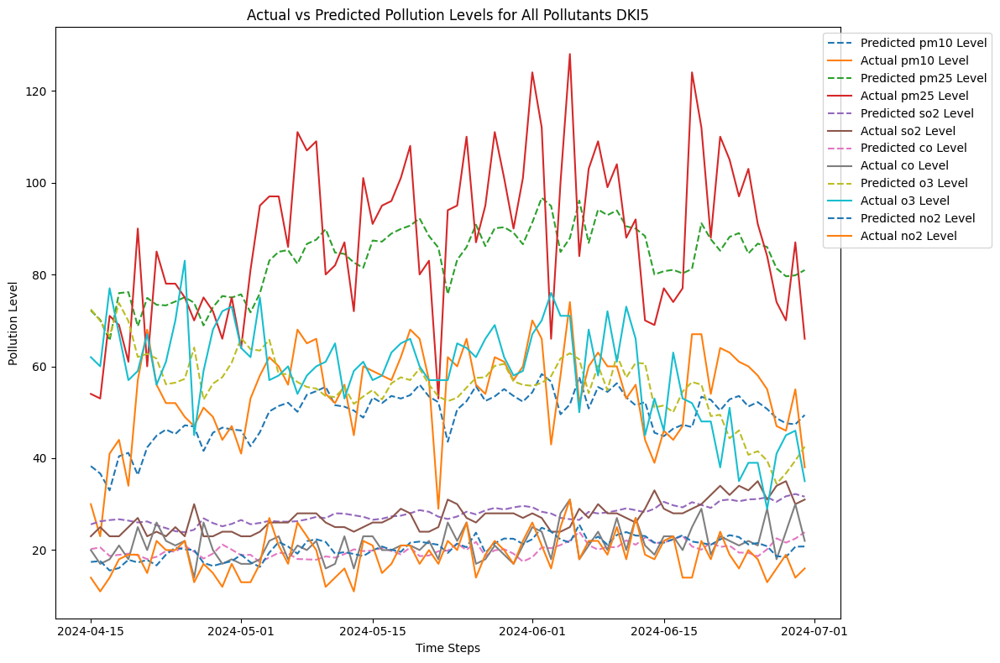

In [ ]:
fig, ax = plt.subplots(figsize=(12, 8))

# Plot predicted and actual pollution levels for all pollutants in the same graph
for i, polutan in enumerate(polutan_column):
  ax.plot(df_final5.index, df_final5_denormalisasi.iloc[:, i+6].values, label=f'Predicted {polutan} Level', linestyle='--')
  ax.plot(df_final5.index, df_final5_denormalisasi[polutan].values, label=f'Actual {polutan} Level')

ax.set_title('Actual vs Predicted Pollution Levels for All Pollutants DKI5')
ax.set_xlabel('Time Steps')
ax.set_ylabel('Pollution Level')
ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.tight_layout()
plt.show()

# SAVED MODEL


In [ ]:
model_CNNLSTM.save('my_model.h5')